# ResponsibleAI Project

  - **Author**: Henning Heyen
  - **Date**: 01/03/2023



---



Welcome to this notebook on Responsible AI. This project aims to touch on the most important topics in the field of Responsible AI including bias, fairness, interpretability, error analysis and counterfactuals. 

We use the famous [UCI Adult Census Income dataset](https://archive.ics.uci.edu/ml/datasets/adult) to apply the responsible AI concepts. 

### Content

1. **ML models**: After an in-depth exploratory analysis of the dataset we create two white-box models (Decision Trees) and one black-box model (Gradient Boosting).
2. **Interpretating models**: This section aims to introduce common interpretability techniques including global (tree plots, feature importance, PDP plots) and local (SHAP, LIME) techniques
3. **Error Analysis**: Here we compare the models based on fairness and create a bias-mitigated model using the [fairlearn](https://github.com/fairlearn/fairlearn) library. We further investigate potential fairness-accuracy tradeoffs and discover the sources of bias in the data. 
4. **What if Counterfacticals**: Inspired by Causal ML modelling we test how the models' prediction changes when we change individual features using the [DiceML](https://interpret.ml/DiCE/dice_ml.html) library.
5. **Documentation**: We create a datasheet for the dataset and a model card for our most fair model.
6. **References**


# Table of Contents

[1 ML models](#1_ML_models)
  - [1.1 Preprocessing](#1.1_Preprocessing)
  - [1.2 Interpretable by design Models](#1.2_Interpretable_by_design_Models)
    - [1.2.1 Large Decision Tree](#1.2.1_Large_Decision_Tree)
    - [1.2.2 Small Decision Tree](#1.2.2_Small_Decision_Tree)
  - [1.3 Black box Model](#1.3_Black_box_Model)
  - [1.4 Comparison and Summary](#1.4_Comparison_and_Summary)

[2 Interpretating models](#2_Interpretating_models)
  - [2.1 Global Interpretability Frameworks](#2.1_Global_Interpretability_Frameworks)
    - [2.1.1 Plotting the Tree](#2.1.1_Plotting_the_Tree)
    - [2.1.2 Feature Importance](#2.1.2_Feature_Importance)
    - [2.1.3 Partial Dependence Plots (PDP)](#2.1.3_Partial_Dependence_Plots)
  - [2.2 Local Interpretability Frameworks](#2.2_Local_Interpretability_Frameworks)
    - [2.2.1 SHAP](#2.2.1_SHAP)
    - [2.2.2 LIME](#2.2.2_LIME)

[3 Error Analysis](#3_Error_Analysis)
  - [3.1 Fairness Assessment of Existing Models](#3.1_Fairness_Assessment_of_Existing_Models)
  - [3.2 Least Fair Model](#3.2_Least_Fair_Model)
  - [3.3 Mititgations](#3.3_Mititgations)
  - [3.4 Accuracy Fairness Tradeoff](#3.4_Accuracy_Fairness_Tradeoff)
  - [3.5 Most Fair Model](#3.5_Most_Fair_Model)
  - [3.6 Potential sources of Bias in the Data](#3.6_Potential_sources_of_Bias_in_the_Data)

[4 What-if Counterfactuals? ](#4_What_if_Counterfactuals)
  - [4.1 Using the least fair model](#4.1_Using_the_least_fair_model)
  - [4.2 Using the most fair model](#4.2_Using_the_most_fair_model)

[5 Documentation](#5_Documentation)
  - [5.1 Datasheet](#5.1_Datasheet)
  - [5.2 Model Card for the most fair model](#5.2_Model_Card_for_the_most_fair_model)

[6 References](#6_References)



---



<a id='1_ML_models'></a>
# 1 ML models


<a id='1.1_Preprocessing'></a>
## 1.1 Preprocessing


In [94]:
# Standard Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import balanced_accuracy_score, roc_curve, auc, classification_report

# Classifiers
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import GradientBoostingClassifier

# Interpretability Libraries
from pdpbox import pdp #, get_dataset, info_plots
import shap
from lime.lime_tabular import LimeTabularExplainer
from fairlearn.postprocessing import ThresholdOptimizer
from fairlearn.metrics import (
    MetricFrame,
    selection_rate,
    count,
    selection_rate_difference,
)
from dice_ml import Data, Model, Dice

In [ ]:
# For plotting matplotlib plots in jupyter notebook
%matplotlib inline



---



**Import Data**

In [4]:
# Using the same feature names as in Lab 1 (more understandable than the default ones)
names = ['age','workclass','fnlwgt','education','education-num',
        'marital-status','occupation','relationship','race','sex',
        'capital-gain','capital-loss','hours-per-week','native-country',
        'y']

df_train = pd.read_csv("data/adult.csv",names=names)
df_test = pd.read_csv("data/adult.test",names=names)

df_train_copy = df_train.copy()
df_test_copy = df_test.copy()




---



**Preprocessing and EDA**

First, we need to check for duplicated entries and remove them

In [5]:
print(sum(df_train.duplicated()))
print(sum(df_test.duplicated()))

24
5


In [6]:
df_train = df_train.drop_duplicates()
df_test = df_test.drop_duplicates()

In [7]:
print(df_train.shape)
print(df_test.shape)

(32537, 15)
(16277, 15)


We have 32537 observations in the train set and 16277 in the test set. There are 14 feature plus 1 target variable.

The final weight `fnlwgt` feature is not well defined and commonly dropped from the data. (Originally it indicates the number of people the census believes the entry represents)

In [8]:
df_train.drop('fnlwgt', axis=1, inplace=True)
df_test.drop('fnlwgt', axis=1, inplace=True)

In [9]:
df_train.head()

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,y
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


The target variable `y` indicates whether a person's income is above or below 50k per year. The task is to precdict the income variable.

In [10]:
df_train.isnull().sum()

age               0
workclass         0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loss      0
hours-per-week    0
native-country    0
y                 0
dtype: int64

In [11]:
df_test.isnull().sum()

age               0
workclass         1
education         1
education-num     1
marital-status    1
occupation        1
relationship      1
race              1
sex               1
capital-gain      1
capital-loss      1
hours-per-week    1
native-country    1
y                 1
dtype: int64

In [12]:
print(df_test.isnull().any(axis=1).sum())

1


No null values in the train set. There is one entry in the test set with most features being null. As this entry does not contain much information (especially the income is unknown) we can drop this entry.

In [13]:
df_test = df_test.dropna()

Lets perform some quick **Exploratory Data Analysis**

In [14]:
df_train.describe()

,age,education-num,capital-gain,capital-loss,hours-per-week
count,32537.000000,32537.000000,32537.000000,32537.000000,32537.000000
mean,38.585549,10.081815,1078.443741,87.368227,40.440329
std,13.637984,2.571633,7387.957424,403.101833,12.346889
min,17.000000,1.000000,0.000000,0.000000,1.000000
25%,28.000000,9.000000,0.000000,0.000000,40.000000
50%,37.000000,10.000000,0.000000,0.000000,40.000000
75%,48.000000,12.000000,0.000000,0.000000,45.000000
max,90.000000,16.000000,99999.000000,4356.000000,99.000000


Main charateristics:
- average age is 38.5
- average years in education is 10
- average hours per week is 40

In [15]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32537 entries, 0 to 32560
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32537 non-null  int64 
 1   workclass       32537 non-null  object
 2   education       32537 non-null  object
 3   education-num   32537 non-null  int64 
 4   marital-status  32537 non-null  object
 5   occupation      32537 non-null  object
 6   relationship    32537 non-null  object
 7   race            32537 non-null  object
 8   sex             32537 non-null  object
 9   capital-gain    32537 non-null  int64 
 10  capital-loss    32537 non-null  int64 
 11  hours-per-week  32537 non-null  int64 
 12  native-country  32537 non-null  object
 13  y               32537 non-null  object
dtypes: int64(5), object(9)
memory usage: 3.7+ MB


In [16]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16276 entries, 1 to 16281
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             16276 non-null  object 
 1   workclass       16276 non-null  object 
 2   education       16276 non-null  object 
 3   education-num   16276 non-null  float64
 4   marital-status  16276 non-null  object 
 5   occupation      16276 non-null  object 
 6   relationship    16276 non-null  object 
 7   race            16276 non-null  object 
 8   sex             16276 non-null  object 
 9   capital-gain    16276 non-null  float64
 10  capital-loss    16276 non-null  float64
 11  hours-per-week  16276 non-null  float64
 12  native-country  16276 non-null  object 
 13  y               16276 non-null  object 
dtypes: float64(4), object(10)
memory usage: 1.9+ MB


There are 9 categorical variables that have to be encoded:

* `workclass`
* `education`
* `marital-status`
* `occupation`
* `releationship`
* `race`
* `sex`
* `native-country`
* `y`


`age` is encoded as strings in the test set. We cast `age` to `int64`. Also the numeric variables in the test set are `float64`. We cast them to `int64` such that types are consistent accross train and test data

In [17]:
# Numerical variables
numerics = ['age', 'education-num', 'capital-gain', 'capital-loss', 'hours-per-week']

# Casting to int64
df_test[numerics] = df_test[numerics].astype('int64')

In [18]:
# Categorical variables
categories = ['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'native-country', 'y']

# Checking uniques values of categorical variables
for cat in categories:
  list_train = np.sort(list(df_train[cat].unique()))
  list_test = np.sort(list(df_test[cat].unique()))
  print(cat, " train set: ", list_train)
  print(cat, ": test set", list_test)

  equal = np.array_equal(list_train,list_test)
  print("Are both sets equal? ", equal)
  if not equal:
    print("Unique categories :", set(list_train) ^ set(list_test))
  print('-'*50)

workclass  train set:  [' ?' ' Federal-gov' ' Local-gov' ' Never-worked' ' Private'
 ' Self-emp-inc' ' Self-emp-not-inc' ' State-gov' ' Without-pay']
workclass : test set [' ?' ' Federal-gov' ' Local-gov' ' Never-worked' ' Private'
 ' Self-emp-inc' ' Self-emp-not-inc' ' State-gov' ' Without-pay']
Are both sets equal?  True
--------------------------------------------------
education  train set:  [' 10th' ' 11th' ' 12th' ' 1st-4th' ' 5th-6th' ' 7th-8th' ' 9th'
 ' Assoc-acdm' ' Assoc-voc' ' Bachelors' ' Doctorate' ' HS-grad'
 ' Masters' ' Preschool' ' Prof-school' ' Some-college']
education : test set [' 10th' ' 11th' ' 12th' ' 1st-4th' ' 5th-6th' ' 7th-8th' ' 9th'
 ' Assoc-acdm' ' Assoc-voc' ' Bachelors' ' Doctorate' ' HS-grad'
 ' Masters' ' Preschool' ' Prof-school' ' Some-college']
Are both sets equal?  True
--------------------------------------------------
marital-status  train set:  [' Divorced' ' Married-AF-spouse' ' Married-civ-spouse'
 ' Married-spouse-absent' ' Never-married' '

Looking at the unique values of the categorical variables in the train and test set we can make **four observations**.

**Observation 1**: `workclass`, `occupation` and `native-conutry` contain `' ?'` values which indicate missing values. They will be encoded as null values and then imputed by the most frequent occuring value (mode)

In [19]:
df_train[df_train== ' ?'] = np.nan
df_test[df_test== ' ?'] = np.nan

In [20]:
df_train.isnull().sum()

age                  0
workclass         1836
education            0
education-num        0
marital-status       0
occupation        1843
relationship         0
race                 0
sex                  0
capital-gain         0
capital-loss         0
hours-per-week       0
native-country     582
y                    0
dtype: int64

In [21]:
df_test.isnull().sum()

age                 0
workclass         963
education           0
education-num       0
marital-status      0
occupation        966
relationship        0
race                0
sex                 0
capital-gain        0
capital-loss        0
hours-per-week      0
native-country    274
y                   0
dtype: int64

In [22]:
for col in ['workclass', 'occupation', 'native-country']:
    df_train[col].fillna(df_train[col].mode()[0], inplace=True)
    df_test[col].fillna(df_test[col].mode()[0], inplace=True)

**Observation 2**: All categories have some whitespace that can be removed and the target variable in the test set has both outcomes written in two ways (i.e `>50K` vs. `>50K.` and `<=50K` vs. `<=50K.`)

In [23]:
# Removing Whitespaces in categories
for cat in categories:
  df_train[cat] = df_train[cat].str.strip()
  df_test[cat] = df_test[cat].str.strip()

# Fixing target variable in test set
map = {'>50K.': '>50K', '<=50K.': '<=50K', '>50K': '>50K', '<=50K': '<=50K'}
df_test['y'] = [map[y] for y in df_test['y']]

**Observation 3:** There is one value for the `native-country` category in the train data which does not exist in the test data (i.e. `Holand-Netherlands`). Since only one entry in the train dataset is concerned and we don't want to risk data leakage we will simply remove this entry

In [24]:
df_train.drop(index=df_train[df_train['native-country'] == 'Holand-Netherlands'].index, inplace=True)

Lets confirm that all categories are identical across both the train and the test data

In [25]:
equal_list = []
for cat in categories:
  list_train = np.sort(list(df_train[cat].unique()))
  list_test = np.sort(list(df_test[cat].unique()))
  equal_list.append(np.array_equal(list_train,list_test))

if all(equal_list):
    print("All category values are equal in both train and test set")

All category values are equal in both train and test set


**Observation 4:** We find that the categorical variables don't really have an intrinsic order. One hot encoding is more reasonable and interpretable, however, one hot encoding would lead to a much higher feature space. Therefore we first combine some categories and then apply one hot encoding. Only the `occupation` feature can be interpreted as ordinal (in terms of expected saleries). We are using the same encoding as in Lab 3 from COMP0189 Applied AI

**occupation**

In [26]:
# Copied from COMP0189 Applied AI Lab 3
occ_mapping = {
    'Priv-house-serv':0, 'Other-service':0,'Handlers-cleaners':0,
    'Farming-fishing':1,'Machine-op-inspct':1,'Adm-clerical':1,
    'Transport-moving':2,'Craft-repair':2,'Sales':2,
    'Armed-Forces':3,'Tech-support':3,'Protective-serv':3,
    'Prof-specialty':4,'Exec-managerial':4
}

df_train["occupation"] = df_train["occupation"].map(occ_mapping).astype('int64')
df_test["occupation"] = df_test["occupation"].map(occ_mapping).astype('int64')

**education**

In [27]:
df_train['education'].value_counts()

education
HS-grad         10494
Some-college     7281
Bachelors        5353
Masters          1722
Assoc-voc        1382
11th             1175
Assoc-acdm       1067
10th              933
7th-8th           645
Prof-school       576
9th               514
12th              433
Doctorate         413
5th-6th           332
1st-4th           166
Preschool          50
Name: count, dtype: int64

In [28]:
# Combing all school level into one category
df_train['education'].replace(['12th', '11th', '9th', '7th-8th', '5th-6th', '10th', '1st-4th', 'Preschool'],
                             'School', inplace = True)
df_test['education'].replace(['12th', '11th', '9th', '7th-8th', '5th-6th', '10th', '1st-4th', 'Preschool'],
                             'School', inplace = True)

In [29]:
df_train['education'].value_counts()

education
HS-grad         10494
Some-college     7281
Bachelors        5353
School           4248
Masters          1722
Assoc-voc        1382
Assoc-acdm       1067
Prof-school       576
Doctorate         413
Name: count, dtype: int64

**race**

In [30]:
df_train['race'].value_counts()

race
White                 27794
Black                  3122
Asian-Pac-Islander     1038
Amer-Indian-Eskimo      311
Other                   271
Name: count, dtype: int64

In [31]:
# Combing Asian-Pac-Islander Amer-Indian-Eskimo into other
df_train['race'].replace(['Asian-Pac-Islander', 'Amer-Indian-Eskimo'],
                             'Other', inplace = True)
df_test['race'].replace(['Asian-Pac-Islander', 'Amer-Indian-Eskimo'],
                             'Other', inplace = True)

In [32]:
df_train['race'].value_counts()

race
White    27794
Black     3122
Other     1620
Name: count, dtype: int64

**native-country**

In [33]:
df_train['native-country'].value_counts()

native-country
United-States                 29735
Mexico                          639
Philippines                     198
Germany                         137
Canada                          121
Puerto-Rico                     114
El-Salvador                     106
India                           100
Cuba                             95
England                          90
Jamaica                          81
South                            80
China                            75
Italy                            73
Dominican-Republic               70
Vietnam                          67
Japan                            62
Guatemala                        62
Poland                           60
Columbia                         59
Taiwan                           51
Haiti                            44
Iran                             43
Portugal                         37
Nicaragua                        34
Peru                             31
France                           29
Greece       

In [34]:
# Combing countries in continents and keeping USA seperate as most samples are from the US
usa = ["United-States"]
central_america =["Cuba", "Dominican-Republic", "El-Salvador", "Guatemala",
                   "Haiti", "Honduras", "Jamaica", "Mexico", "Nicaragua",
                   "Outlying-US(Guam-USVI-etc)", "Puerto-Rico", "Trinadad&Tobago"]
asia =["Cambodia", "China", "Hong", "India", "Iran", "Japan", "Laos",
          "Philippines", "Taiwan", "Thailand", "Vietnam"]
south_america =["Columbia", "Ecuador", "Peru"]
europe =["England", "France", "Germany", "Greece", "Holand-Netherlands",
            "Hungary", "Ireland", "Italy", "Poland", "Portugal", "Scotland",
            "Yugoslavia"]
# Canada does not fit to the other continents and is not USA and therefore categorised as other. Only 121 are concered in train set
other =["South", "Canada"]

continents = [usa, central_america, asia, south_america, europe, other]
continent_names = ['usa', 'central-america', 'asia', 'south-america', 'europe', 'other']


for i, continent in enumerate(continents):
  df_train['native-country'].replace(continent, continent_names[i], inplace = True)
  df_test['native-country'].replace(continent, continent_names[i], inplace = True)

In [35]:
df_train['native-country'].value_counts()

native-country
usa                29735
central-america     1291
asia                 671
europe               520
other                201
south-america        118
Name: count, dtype: int64

**marital-status**

In [36]:
df_train['marital-status'].value_counts()

marital-status
Married-civ-spouse       14970
Never-married            10666
Divorced                  4441
Separated                 1025
Widowed                    993
Married-spouse-absent      418
Married-AF-spouse           23
Name: count, dtype: int64

In [37]:
# marital-status can be reduced to 'married', 'not married' and 'never married'
df_train['marital-status'].replace(['Married-civ-spouse', 'Married-spouse-absent', 'Married-AF-spouse'], 'married', inplace = True)
df_test['marital-status'].replace(['Married-civ-spouse', 'Married-spouse-absent', 'Married-AF-spouse'], 'married', inplace = True)

df_train['marital-status'].replace(['Divorced', 'Separated', 'Widowed'], 'not-married', inplace = True)
df_test['marital-status'].replace(['Divorced', 'Separated', 'Widowed'], 'not-married', inplace = True)


In [38]:
df_train['marital-status'].value_counts()

marital-status
married          15411
Never-married    10666
not-married       6459
Name: count, dtype: int64

**workclass**:

In [ ]:
df_train['workclass'].value_counts()

Private             24508
Self-emp-not-inc     2540
Local-gov            2093
State-gov            1298
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: workclass, dtype: int64

In [ ]:
# workclass can be reduced to 'Goverment-sector', 'Unemployed', 'Self-employed', 'Private'
df_train['workclass'].replace(['Local-gov', 'Federal-gov', 'State-gov'], 'Goverment-sector', inplace = True)
df_test['workclass'].replace(['Local-gov', 'Federal-gov', 'State-gov'], 'Goverment-sector', inplace = True)

df_train['workclass'].replace(['Without-pay', 'Never-worked'], 'Unemployed', inplace = True)
df_test['workclass'].replace(['Without-pay', 'Never-worked'], 'Unemployed', inplace = True)

df_train['workclass'].replace(['Self-emp-not-inc', 'Self-emp-inc'], 'Self-employed', inplace = True)
df_test['workclass'].replace(['Self-emp-not-inc', 'Self-emp-inc'], 'Self-employed', inplace = True)

In [ ]:
df_train['workclass'].value_counts()

Private             24508
Goverment-sector     4351
Self-employed        3656
Unemployed             21
Name: workclass, dtype: int64

Now let use plot the distribution of all variables and gain some insights

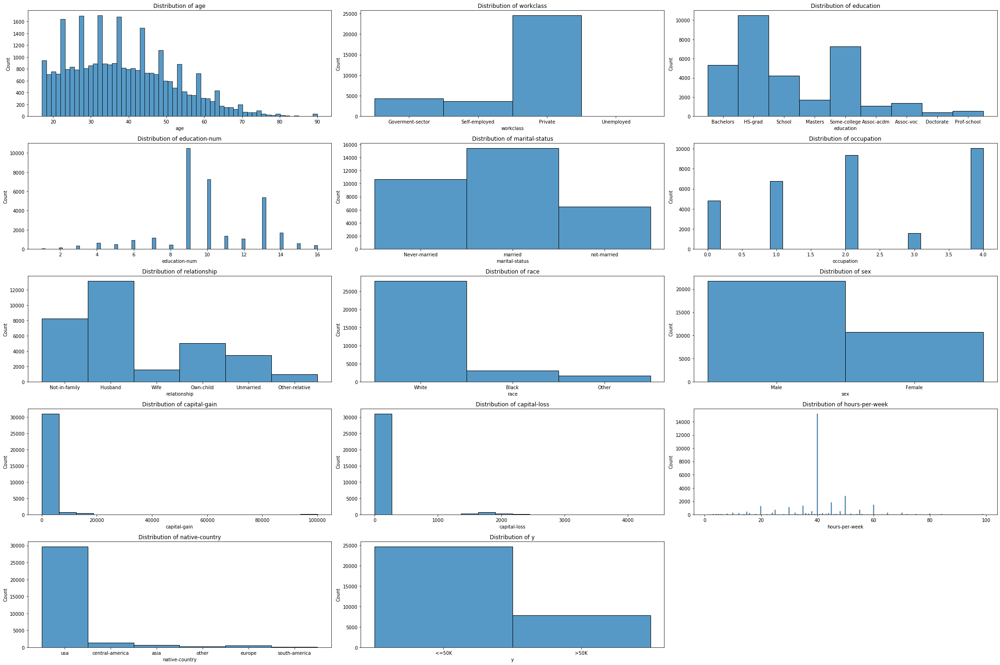

In [ ]:
plt.figure(figsize=(30,20))
for i,column in enumerate(df_train.columns):
 plt.subplot(5,3,i+1)
 plt.title(f"Distribution of {column}")
 sns.histplot(df_train[column])
 plt.tight_layout()
 plt.plot()

**Key observations**:
- most people work in the private sector
- most people have between 10 and 14 years of education
- the vast majority is white, male and is natively from the US
- most people have 0 capital-gain and 0 capital-loss
- there some outliers in capital-gain
- most people work 40h a week
- the target variable is imbalanced

In [ ]:
df_train['y'].value_counts()/df_train.shape[0]

<=50K    0.759067
>50K     0.240933
Name: y, dtype: float64

In [ ]:
df_test['y'].value_counts()/df_test.shape[0]

<=50K    0.763701
>50K     0.236299
Name: y, dtype: float64

About 76% of all samples earn less 50K in both train and test data meaning the data is **highly imbalanced**. To take that into account for evaluating our model's performance we will use sklearn's `balanced_accuracy_score` as a main metric to get more meaningful results.

Lets pair plot the numerical variables against the target variable income.

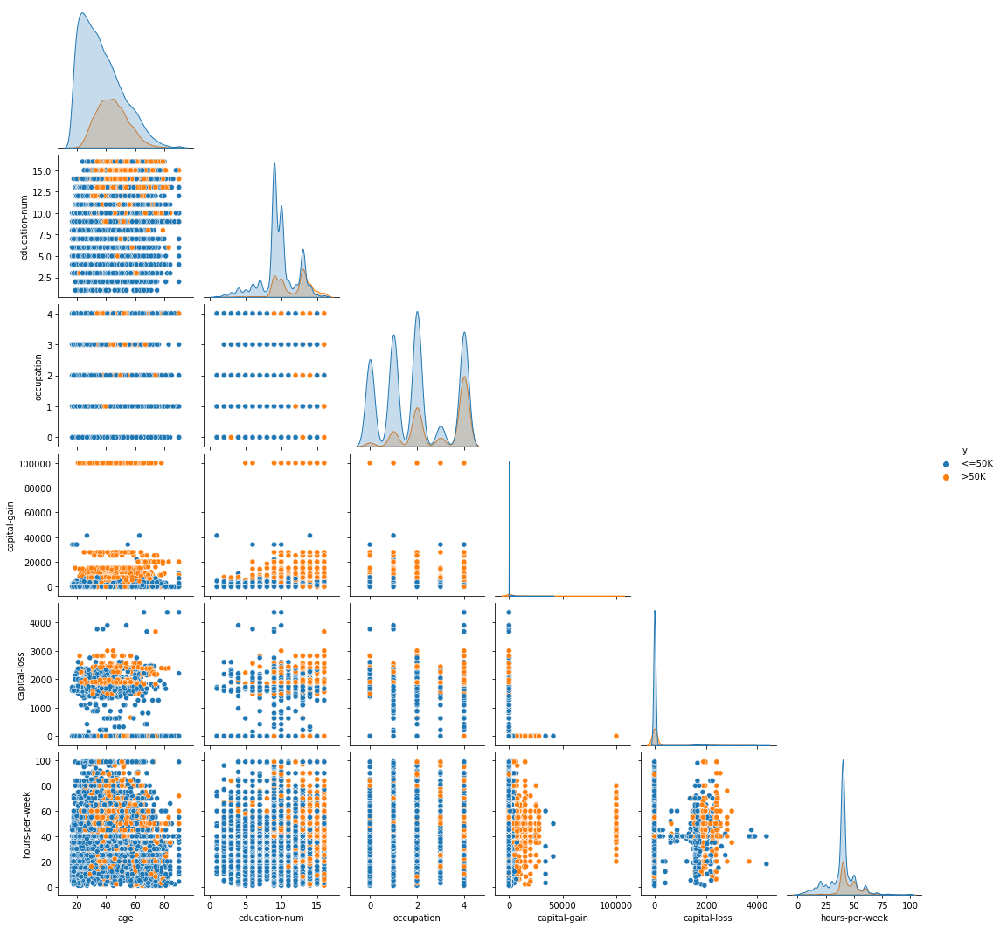

In [ ]:
sns.pairplot(df_train, hue="y", corner=True);

**Key observations**:
- people with more years in education tend to have high income
- Low level occupation (e.g. `Handlers-cleaners`, `Service-Others`) have low income
- `hours-per-week` is normally distributed with mean 40
- Hours worked is positively correlated with high income

Let's plot the **correlation matrix** for the numeric features

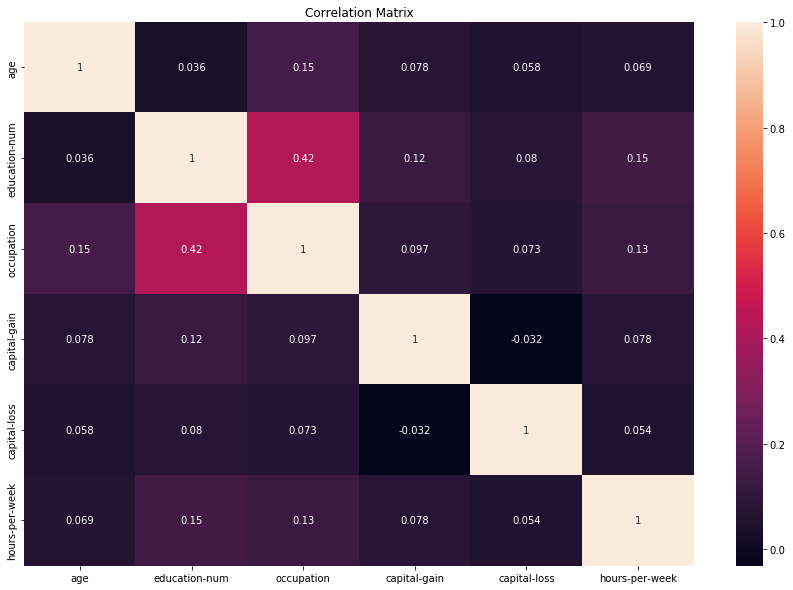

In [ ]:
plt.figure(figsize=(15,10))
ax = sns.heatmap(df_train.corr(),annot = True)
#Fixing a bug in the representation
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('Correlation Matrix')
plt.show()

There is a strong positive correlation between `education-num` and `occupation` (0.42). We should take that into account when models use those features to predict the income.

Less strong but positive correlations are between
- `education-num` and `hours-per-week` (0.15)
- `age` and `occupation` (0.15)
- `occupation` and `hours-per-week` (0.13)
- `education-num` and `capital-gain` (0.12)

The same correlations were found on the test set

Lets check for outliers

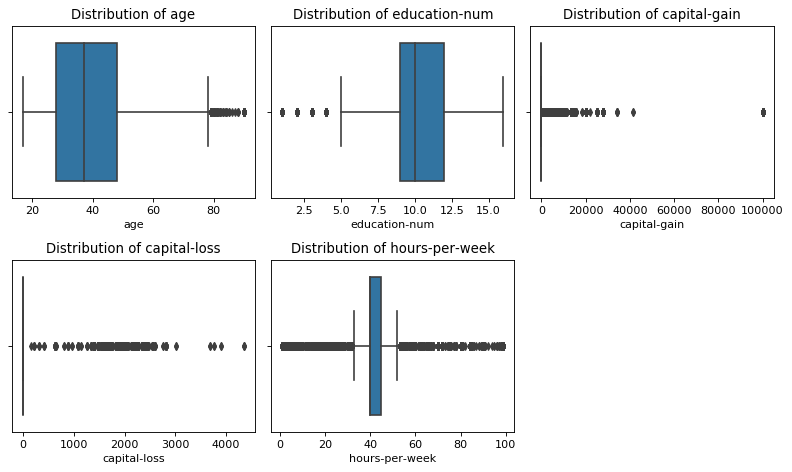

In [ ]:
plt.figure(figsize=(10,6), dpi=80)
for i,column in enumerate(df_train[numerics]):
 plt.subplot(2,3,i+1)
 plt.title(f"Distribution of {column}")
 ax = sns.boxplot(data=df_train, x=column)
 plt.tight_layout()
 plt.plot()

Most measurements seem reasonable except from `capital-gain` where some samples are far off (`99999`) from the other samples. We interpret that as measurement mistakes and replace by the median. The same observation was made on the test test

In [ ]:
print(len(df_train['capital-gain'][df_train['capital-gain']==99999]))
print(len(df_test['capital-gain'][df_test['capital-gain']==99999]))

159
85


159 samples are affected in the train set and 85 in the test set. Lets replace them by the respective median

In [ ]:
meadian_train = df_train['capital-gain'].median()
df_train['capital-gain'].replace(99999, meadian_train,inplace=True)

meadian_test = df_test['capital-gain'].median()
df_test['capital-gain'].replace(99999, meadian_test,inplace=True)

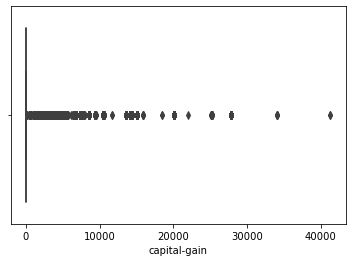

In [ ]:
sns.boxplot(data=df_train, x='capital-gain')

Now we can encode all categorical variables using **One Hot encoding** and **split the data**.

In [65]:
# Saving a copy for better analysis later
df_train_pre_encoding = df_train.copy()
df_test_pre_encoding = df_test.copy()

In [41]:
# Encoding target variable
df_train['y'] = np.where(df_train['y'] == '>50K', 1, 0)
df_test['y'] = np.where(df_test['y'] == '>50K', 1, 0)

# Encoding sex
df_train['sex'] = np.where(df_train['sex'] == 'Male', 1, 0)
df_test['sex'] = np.where(df_test['sex'] == 'Female', 1, 0)

# Train data
X_train = df_train.drop(['y'], axis=1)
y_train = df_train['y']

# Test data
X_test = df_test.drop(['y'], axis=1)
y_test = df_test['y']


In [42]:
# Could be used for other encoding techniques
def encode(method, features, X_train, X_test):
  if method == 'onehot-drop':
    X_train_encoded = pd.get_dummies(X_train, drop_first = True, columns=features)
    X_test_encoded = pd.get_dummies(X_test, drop_first = True, columns=features)
    return X_train_encoded, X_test_encoded
  elif method == 'onehot-nodrop':
    X_train_encoded = pd.get_dummies(X_train, drop_first = False, columns=features)
    X_test_encoded = pd.get_dummies(X_test, drop_first = False, columns=features)
    return X_train_encoded, X_test_encoded
  elif method == 'label':
    le = LabelEncoder()
    X_train_encoded = X_train.copy()
    X_test_encoded = X_test.copy()
    for cat in features:
        X_train_encoded[cat] = le.fit_transform(X_train_encoded[cat])
        X_test_encoded[cat] = le.transform(X_test_encoded[cat])
    return X_train_encoded, X_test_encoded
  else:
    print('method not available')

In [43]:
# Encoding non binary attributes
categories_non_binary = ['workclass', 'education', 'marital-status', 'relationship', 'race', 'native-country'] # occupation is now numeric

# Here we use onehot encoding without dropping redundant categories to increase interpretability. Other methods are possible as well
X_train, X_test = encode('onehot-nodrop', categories_non_binary, X_train, X_test)

Lets plot the correlation matrix again with the one hot encoded variables

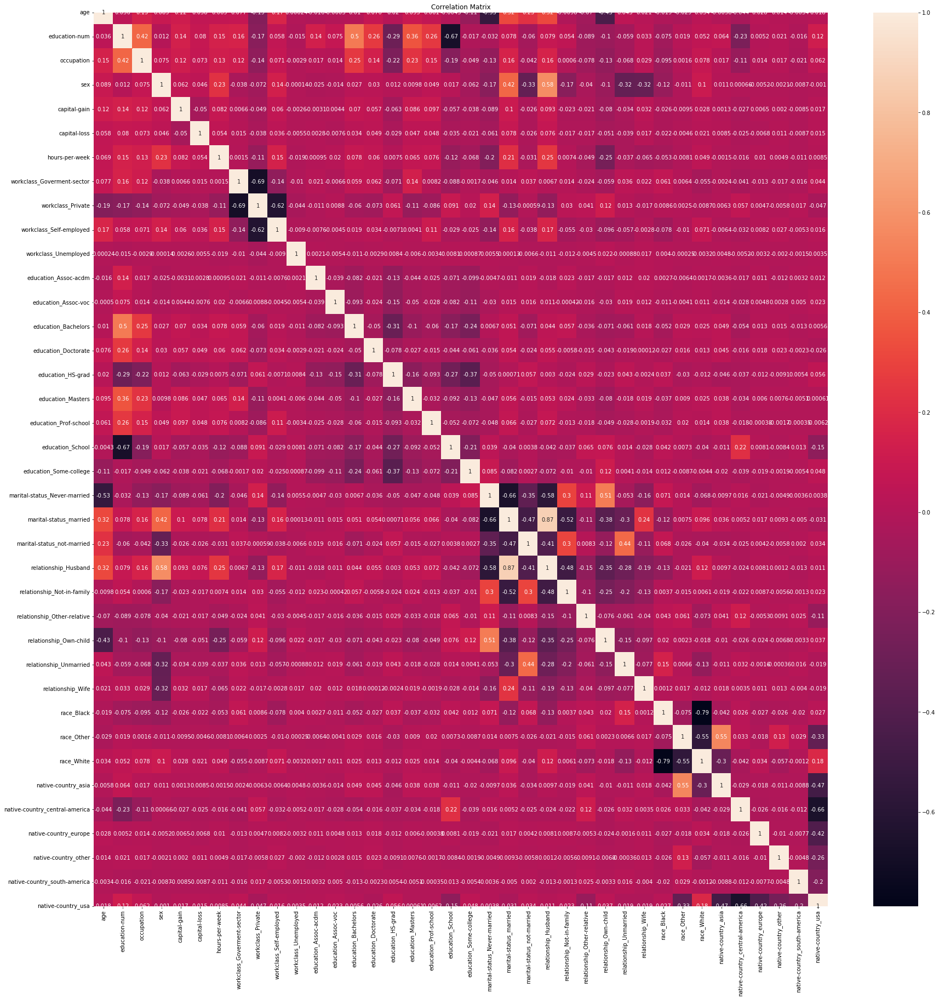

In [ ]:
plt.figure(figsize=(30,30))
sns.heatmap(X_train.corr(),annot = True)
plt.title('Correlation Matrix')
plt.show()

One interesting correlation I want to point out is:
- `marital-status-married` and `sex` (0.42)

That means that being married strongly correlates with being male in this dataset.

Lets check for correlations with the target variable

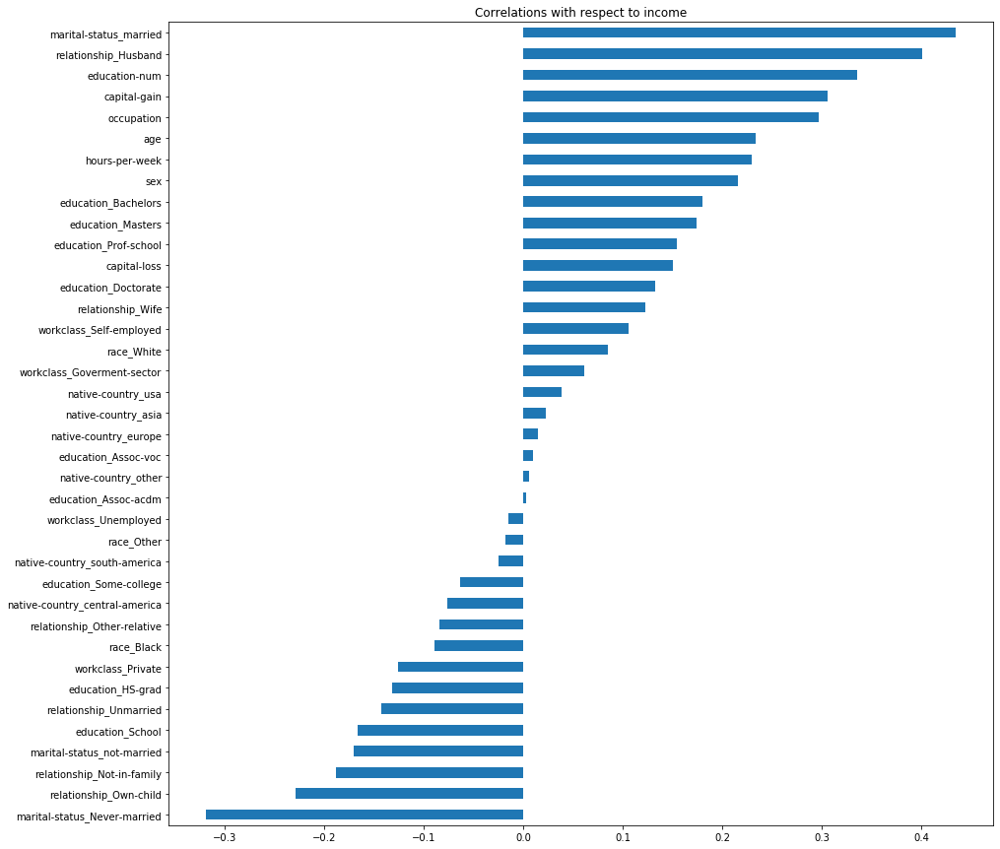

In [ ]:
plt.figure(figsize=(15,15))
pd.concat([X_train, y_train], axis=1).corr()['y'].sort_values()[:-1].plot.barh()
plt.title("Correlations with respect to income")
plt.show()

The most correlated features with income are:
- `marital-status_married`
- `relationship_husband`
- `education-num`
- `capital-gain`
- `occupation`
- `age`

These are not causal relationships.



---



<a id='1.2_Interpretable_by_design_Models'></a>
## 1.2 Interpretable by design Models

**Decision Trees** are *interpretable by design* models [[1, Chapter 5.4]](https://christophm.github.io/interpretable-ml-book/tree.html). Trees are **invariant to feature scaling**. Therefore we do not normalize the numeric features which will also help interpreting the models

In [44]:
# generic fitting
def fit(classifier, X_train, X_test, y_train):
  clf = classifier
  clf.fit(X_train, y_train)
  y_pred = clf.predict(X_test)
  return y_pred

# using balanced accuracy to take imbalance into account
def evaluate(y_pred, y_test):
  return round(balanced_accuracy_score(y_pred, y_test),3)

# printing the classification report
def report(y_pred, y_test):
  print(classification_report(y_test, y_pred, target_names=['<=50K', '>50K']))

<a id='1.2.1_Large_Decision_Tree'></a>

### 1.2.1 Large Decision Tree

Let us first build a **large Decision Tree**. Since there 38 feature after one hot encoding the tree becomes enormous with default hyperparameter settings. Therefore we regard a tree with `max_depth=10` and `min_sample_split=1000` as large.

In [45]:
class_names = ['<=50K', '>50K']
feature_names = list(X_train.columns)

# Saving accuracies
acc = []

In [ ]:
dt_large = DecisionTreeClassifier(criterion='gini', random_state=1, min_samples_split=1000, max_depth=10)
y_pred = fit(dt_large, X_train, X_test, y_train)
acc_dt_large = evaluate(y_pred, y_test)
acc.append(acc_dt_large)
print(dt_large, ' balanced accuracy: ', acc_dt_large)

DecisionTreeClassifier(max_depth=10, min_samples_split=1000, random_state=1)  balanced accuracy:  0.819


<a id='1.2.2_Small_Decision_Tree'></a>

### 1.2.2 Small Decision Tree

Now the **small Decision Tree** will have `max_depth=3`.

In [ ]:
dt_small = DecisionTreeClassifier(criterion='gini', random_state=1, max_depth=3)
y_pred = fit(dt_small, X_train, X_test, y_train)
acc_dt_small = evaluate(y_pred, y_test)
acc.append(acc_dt_small)
print(dt_small, ' balanced accuracy: ', evaluate(y_pred, y_test))

DecisionTreeClassifier(max_depth=3, random_state=1)  balanced accuracy:  0.802


<a id='1.3_Black_box_Model'></a>
## 1.3 Black box Model

As black box model I choose a **Gradient Boosting Tree** (GBT) classifier. GBTs are known to perform well on tabular data . I have also tried some neural networks but the performance was quite poor compared to the Decision Trees. Therefore I choose another tree based algorithms but one that is highly intransparent. There is also a paper on why trees still outperform neural networks [[3]](https://arxiv.org/pdf/2207.08815.pdf).

A GBT is a black box models because it combines a sequence of multiple decision trees. Each tree is opitimized to improve the mistakes made by the previous tree. Even though each individual tree can be analysed it becomes really hard to interprete the ensemble of trees, especially as there potentially hundreds of trees combined.

The hyperparameters were manually tuned because GridSearch was quite inefficient given the wide range hyperparameters they could take.

**Parameters**:
- `learning_rate=0.05`
- `max_depth=5`
- `n_estimators=200`

In [ ]:
black_box = GradientBoostingClassifier(learning_rate= 0.05, max_depth=5, n_estimators=200)
y_pred = fit(black_box, X_train, X_test, y_train)
acc_black_box = evaluate(y_pred, y_test)
acc.append(acc_black_box)
print(black_box, ' balanced accuracy: ', acc_black_box)

GradientBoostingClassifier(learning_rate=0.05, max_depth=5, n_estimators=200)  balanced accuracy:  0.854


<a id='1.4_Comparison_and_Summary'></a>
## 1.4 Comparison and Summary

First, let us plot the ROC curve of all classifiers we have build.

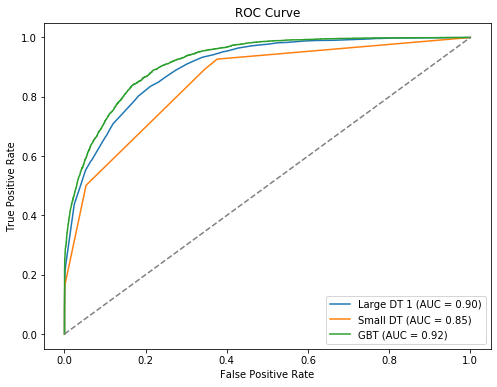

In [ ]:
# Calculate the ROC curve and AUC for each tree
fpr1, tpr1, thresholds1 = roc_curve(y_test, dt_large.predict_proba(X_test)[:, 1])
fpr2, tpr2, thresholds2 = roc_curve(y_test, dt_small.predict_proba(X_test)[:, 1])
fpr3, tpr3, thresholds3 = roc_curve(y_test, black_box.predict_proba(X_test)[:, 1])

auc1 = round(auc(fpr1, tpr1),3)
auc2 = round(auc(fpr2, tpr2),3)
auc3 = round(auc(fpr3, tpr3),3)
aucs = [auc1, auc2, auc3]

# Plot the ROC curves
fig = plt.figure(figsize=(8,6))
plt.plot(fpr1, tpr1, label=f'Large DT 1 (AUC = {auc1:.2f})')
plt.plot(fpr2, tpr2, label=f'Small DT (AUC = {auc2:.2f})')
plt.plot(fpr3, tpr3, label=f'GBT (AUC = {auc3:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='grey')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

We find that all classifiers perform pretty well (AUC >= 0.85). The large Decsion Tree preforms very similar to the GBT motivating to rather use more interpretable Decsion Trees instead of a more complex black box model such as GBT. However due to the imbalance in the target variable we concentrate on `balanced_accuracy_score` to evaluate the models

In [ ]:
algorithms = ['Large DT', 'Small DT', 'GBT']

table = pd.DataFrame({
    'Algorithm': algorithms,
    'Test Balanced Accuracy': acc,
    'AUC': aucs
})

table.head()

,Algorithm,Test Balanced Accuracy,AUC
0,Large DT,0.819,0.899
1,Small DT,0.802,0.850
2,GBT,0.854,0.919


As for **Balanced Accuracy** all models perform quite well on the test set (>0.8). As expected the black box model GBT (0.855) performs significantly better than the Decision trees. Interestingly, the Large Decision Tree (0.819) only performs slightly better than the small Decision Tree (0.802).



---



<a id='2_Interpretating_models'></a>
# 2 Interpretating models

<a id='2.1_Global_Interpretability_Frameworks'></a>
## 2.1 Global Interpretability Frameworks


<a id='2.1.1_Plotting_the_Tree'></a>
### 2.1.1 Plotting the Tree

Decision Trees are interpretable by Design meaning we can plot the tree and understand the decision making of the model.

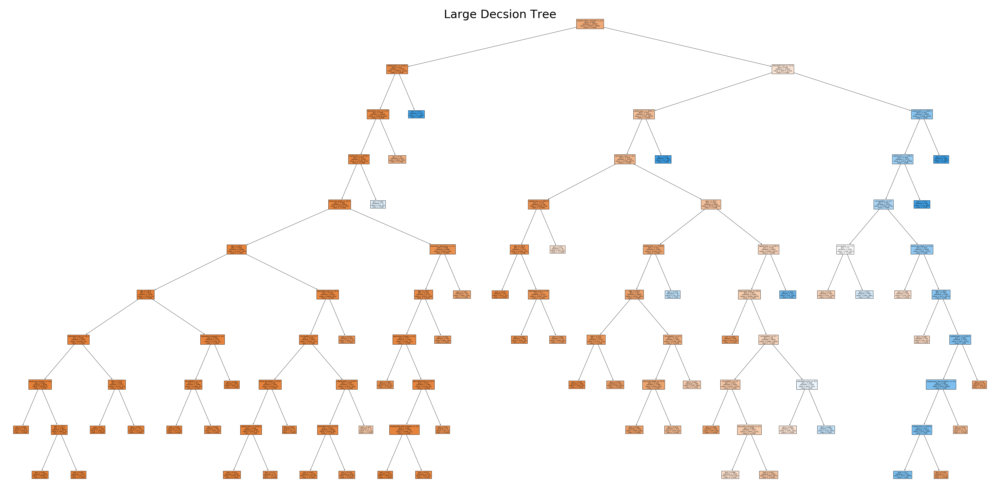

In [ ]:
fig = plt.figure(figsize=(60,30))
plot_tree(dt_large, filled=True, feature_names=feature_names, class_names=class_names)
plt.tight_layout()
plt.suptitle("Large Decsion Tree", fontsize=50)
plt.show()

Obviously the tree is too big to get an get an overall idea how the model determined its prediction. The color intensity of a node indicates its purity. So for example in dark organge nodes all samples are predicted as `<=50K` whereas for dark blue nodes all samples are predicted as `>50K`. The less intense the color the more impurity. Let us see the tree for the small Decision Tree classifier

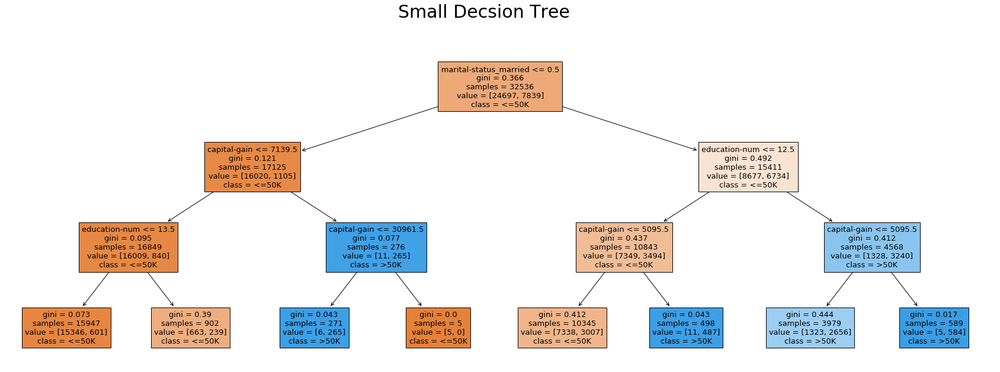

In [ ]:
fig = plt.figure(figsize=(30,10))
plot_tree(dt_small, filled=True, feature_names=feature_names, class_names=class_names)
plt.suptitle("Small Decsion Tree", fontsize=30)
plt.show()

The plot of the small decision tree is much more interpretable than the large one.

First of all we find that only three features are involved in the small tree (`marital-status_married`, `capital-gain`, `education_num`) which makes it very human understandable. Those features are very well aligned with the correlations discussed earlier. Despite only three features being used the leafs color are quite intense meaning the impurity is fairly low for the target variable income. First the model checks whether the a person is married or not. If not, then most samples are classified <=50K. For those classified as >50K `capital-gain` is the most impactful feature.

Note that the features do no necessarily imply causal relations with income. Spurious correlations might be involved. For example we found the being married strongly correlated with being male in the dataset. So indirectly the model might base its decisions on gender which would be inresponsible in a credit score setting

There is no comprehensive way to plot the GBT classifier as it combines hundreds of trees making it hard to interprete decisions. However we can extract feature importances.

**Summary**: Using the actual tree structure to compare the models the small decision tree is definitely the most interpretable one. There are other technique to also make the other model more interpretable. Let's start with feature importance

<a id='2.1.2_Feature_Importance'></a>
### 2.1.2 Feature Imprtance

Let us first look at the feature importance for the trees we have built previously. Feature importance can indicate which features have greater influence on the model's decision for predicting the target variable income. Note that we only show the top 10 most important features

In [ ]:
# From https://medium.com/chinmaygaikwad/feature-importance-and-visualization-of-tree-models-d491e8198b0a
feat_dict= {}
for col, val in sorted(zip(X_train.columns, dt_large.feature_importances_),key=lambda x:x[1],reverse=True):
  feat_dict[col]=val

feat_df = pd.DataFrame({'Feature':feat_dict.keys(),'Importance':feat_dict.values()})
feat_df.head(10)

,Feature,Importance
0,marital-status_married,0.422247
1,education-num,0.232743
2,capital-gain,0.193302
3,capital-loss,0.046936
4,age,0.037802
5,occupation,0.031206
6,hours-per-week,0.026543
7,education_Bachelors,0.004309
8,relationship_Not-in-family,0.002509
9,education_HS-grad,0.002078


Here we find that for the large decision tree the most important feature is `maritial-status_married`. `education-num` and `capital-gain` are almost equally important. The rest is much less important to the classifier (< 5%). That can also explain why the small tree with depth 3 performs almost equally well.

In [ ]:
feat_dict= {}
for col, val in sorted(zip(X_train.columns, dt_small.feature_importances_),key=lambda x:x[1],reverse=True):
  feat_dict[col]=val

feat_df = pd.DataFrame({'Feature':feat_dict.keys(),'Importance':feat_dict.values()})
feat_df.head(10)

,Feature,Importance
0,marital-status_married,0.521211
1,education-num,0.243471
2,capital-gain,0.235318
3,age,0.000000
4,occupation,0.000000
5,sex,0.000000
6,capital-loss,0.000000
7,hours-per-week,0.000000
8,workclass_Goverment-sector,0.000000
9,workclass_Private,0.000000


For the small tree the distribution is almost identical to the large tree. But as depicted in the plot only three features were involved in the decision making process which makes the model easy to understand.


In [ ]:
feat_dict= {}
for col, val in sorted(zip(X_train.columns, black_box.feature_importances_),key=lambda x:x[1],reverse=True):
  feat_dict[col]=val

feat_df = pd.DataFrame({'Feature':feat_dict.keys(),'Importance':feat_dict.values()})
feat_df.head(10)

,Feature,Importance
0,marital-status_married,0.356008
1,capital-gain,0.194160
2,education-num,0.193512
3,capital-loss,0.066804
4,age,0.061058
5,hours-per-week,0.044636
6,occupation,0.042130
7,relationship_Wife,0.008528
8,relationship_Husband,0.006597
9,education_School,0.004365


For the black box model we can still extract feature importances. We find that similar to the decision trees `marital-status_married`, `capital-gain` and `education_num` are the most important features.

**Summary**: We find that in terms of feature importance all models show similar results. The reason behind that is that all models are tree-based algorithms.

<a id='2.1.3_Partial_Dependence_Plots'></a>
### 2.1.3 Partial Dependence Plots (PDP)

PDPs can show whether the relationship between the target and a feature is linear, monotonous or more complex [[1, Chapter 8.1] ](https://christophm.github.io/interpretable-ml-book/pdp.html). PDPs are model agnostic, so we can apply them to all model including the black box model. Let us focus on numeric variables to detect more complex relationships

Limitation: PDP assume features to be uncorrelated which is not the case for these features, see correlation plot. Note that for the small decision tree only three features were used.

In [52]:
# From Lab 2
def plot_pdp(model, model_name, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False, grid_resolution=100):

    # Create the data that we will plot
    pdp_goals = pdp.pdp_isolate(model=model, dataset=df, model_features=df.columns.tolist(), feature=feature)

    # plot it
    pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag,
                 plot_pts_dist=True, plot_params={'title': f'Partial Dependence Plot {model_name} on {feature}'})
    plt.show()

**education-num**

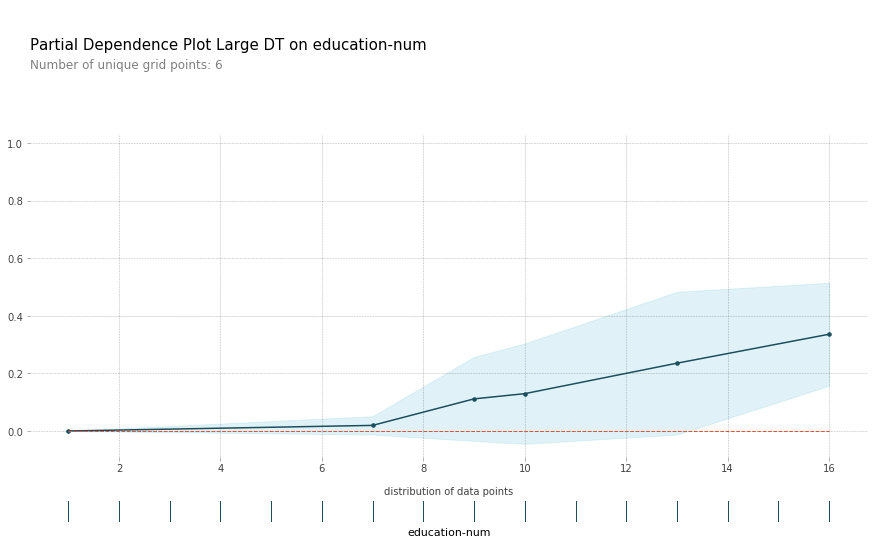

In [ ]:
plot_pdp(dt_large, 'Large DT', X_train, 'education-num')

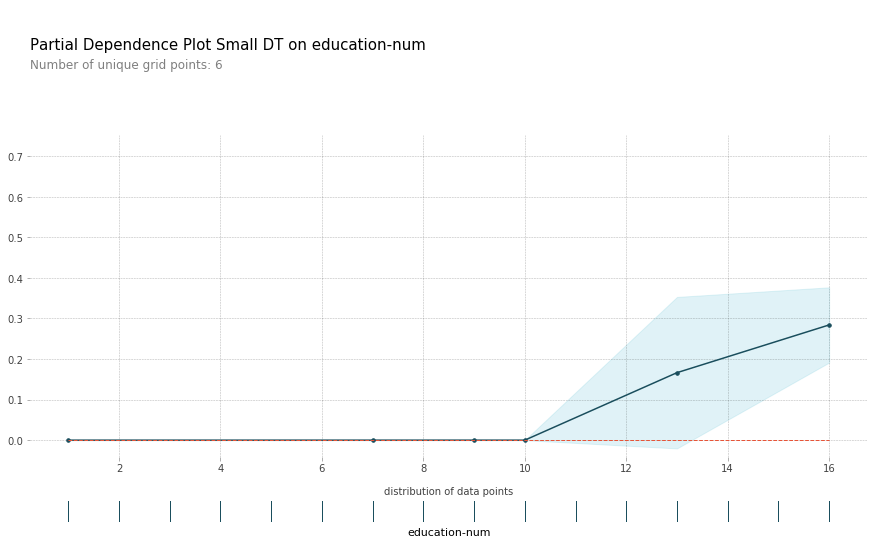

In [ ]:
plot_pdp(dt_small, 'Small DT', X_train, 'education-num')

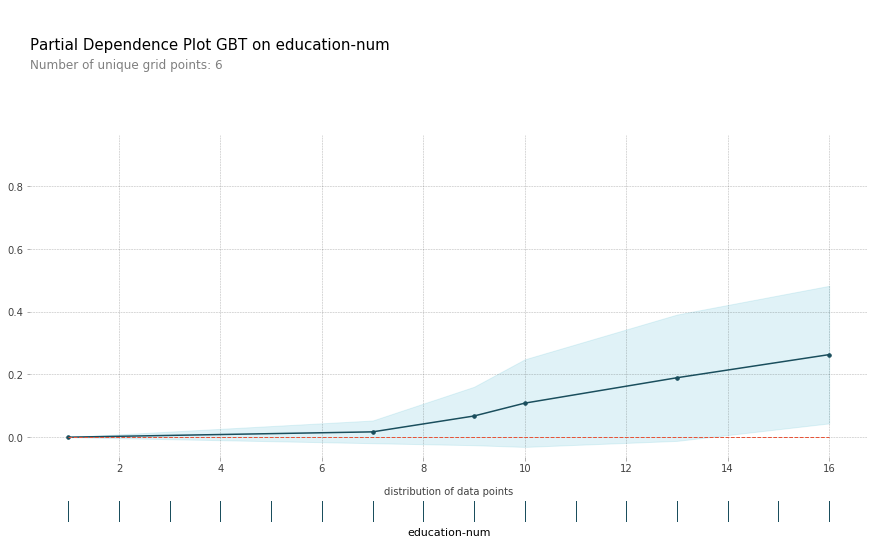

In [ ]:
plot_pdp(black_box, 'GBT', X_train, 'education-num')

We find that for the number of year in education (`education-num`) there is a positive linear relation with income >50K in all models. Furthermore as most people have 7 years of education the effect on income is zero. The  same observation can be made for all models

**capital-gain**

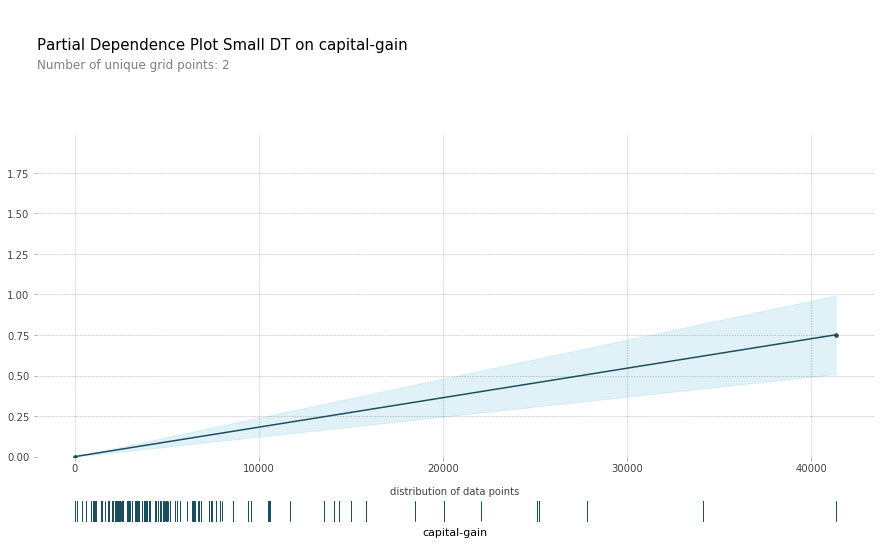

In [ ]:
plot_pdp(dt_large, 'Small DT', X_train, 'capital-gain')

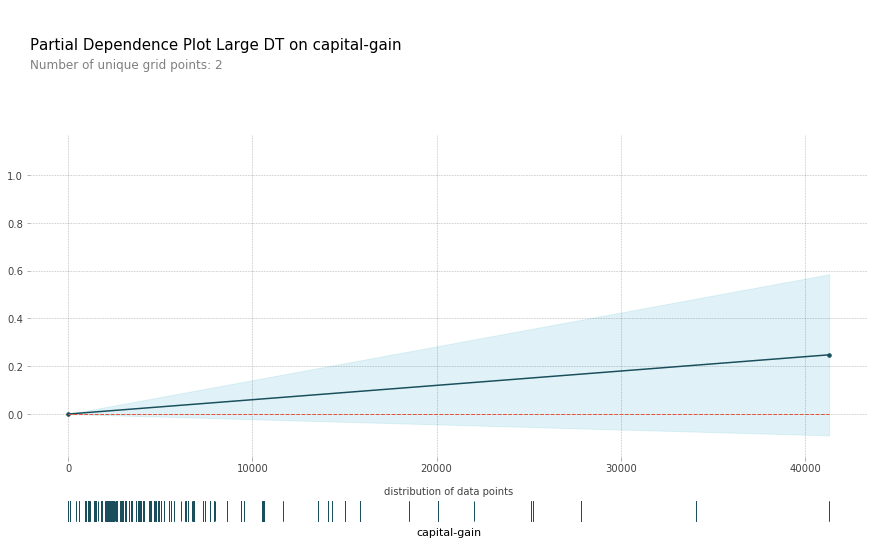

In [ ]:
plot_pdp(dt_small, 'Large DT', X_train, 'capital-gain')

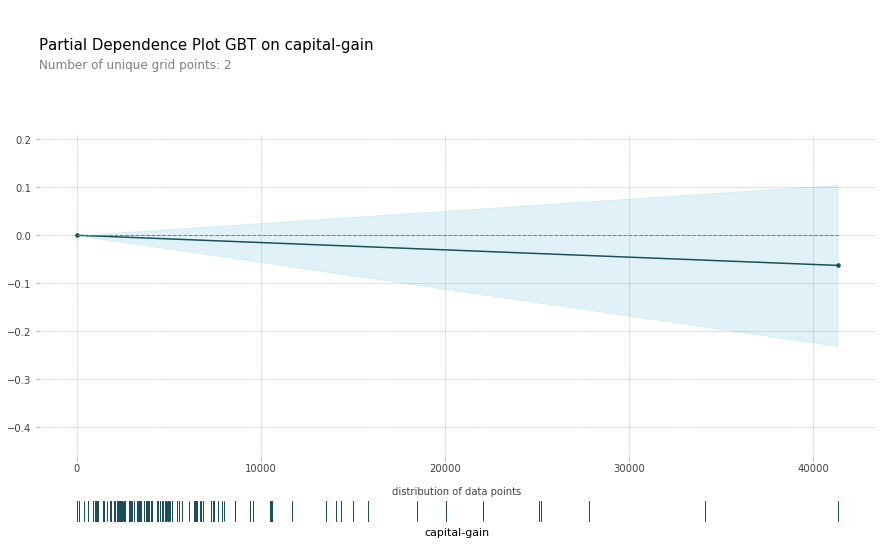

In [ ]:
plot_pdp(black_box, 'GBT', X_train, 'capital-gain')

As for `capital-gain` both Decision trees show a positive linear relationship with income which is reasonable. The GBT classifier shows a very slight negative relationship. However that might be misleading as mentioned in the Interpretable ML book:

"*Heterogeneous effects might be hidden. The PD curve could be a horizontal line, since the effects of both halves of the dataset could cancel each other out. You then conclude that the feature has no effect on the prediction*" [[1, Chapter 8.1.4]](https://christophm.github.io/interpretable-ml-book/pdp.html#disadvantages-5)

One way to mitigate this problem is to plot Individual Conditional Expectation (ICE) curves which I leave for future work.

**hours-per-week**

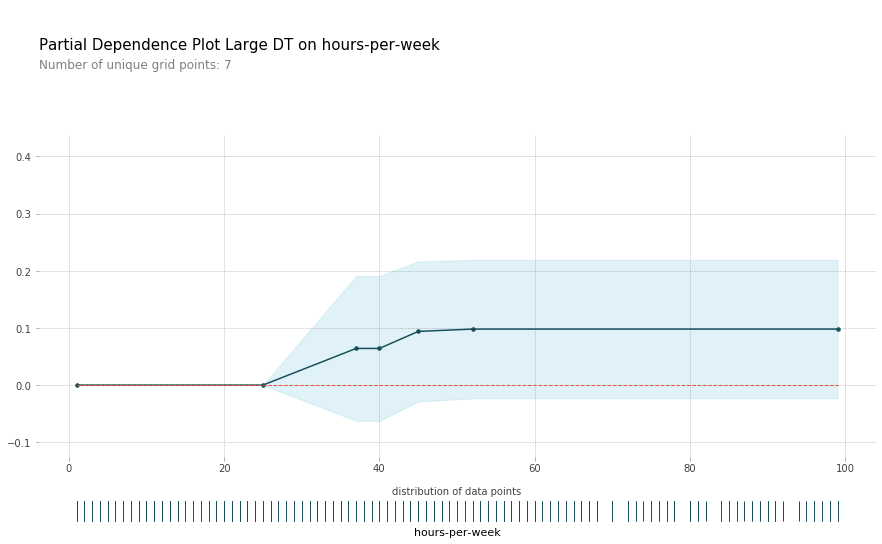

In [ ]:
plot_pdp(dt_large, 'Large DT', X_train, 'hours-per-week')

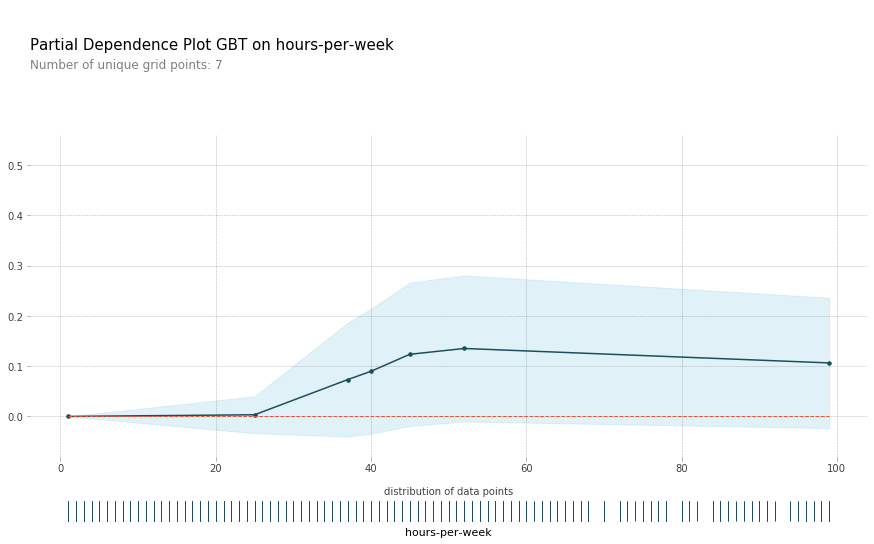

In [ ]:
plot_pdp(black_box, 'GBT', X_train, 'hours-per-week')

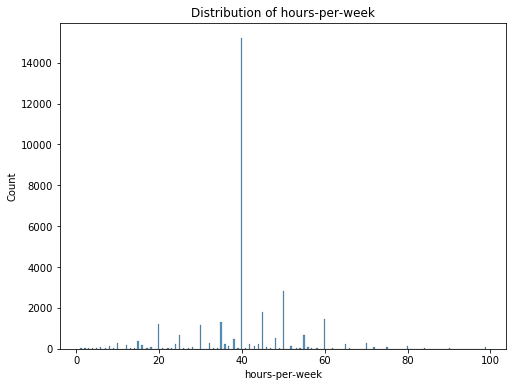

In [ ]:
feature_hist = 'hours-per-week'
plt.figure(figsize=(8,6))
sns.histplot(X_train[feature_hist])
plt.title(f'Distribution of {feature_hist}')
plt.show()

For 25 and 45 hours roughly we find a positve linear relationship between hours worked per week and income for both the large decision tree and GBT. From 50h onwards there seems to be no increase in high income. However as there are less data points this observation is unreliable. Note that the small decision tree does not use the ´hours-per-week´ feature which means the PDP would be constant at zero.

**age**

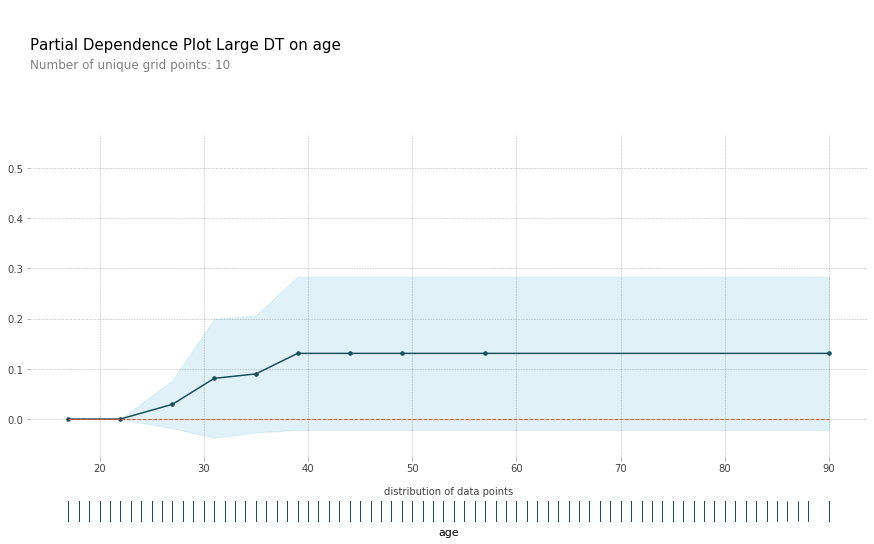

In [ ]:
plot_pdp(dt_large, 'Large DT', X_train, 'age')

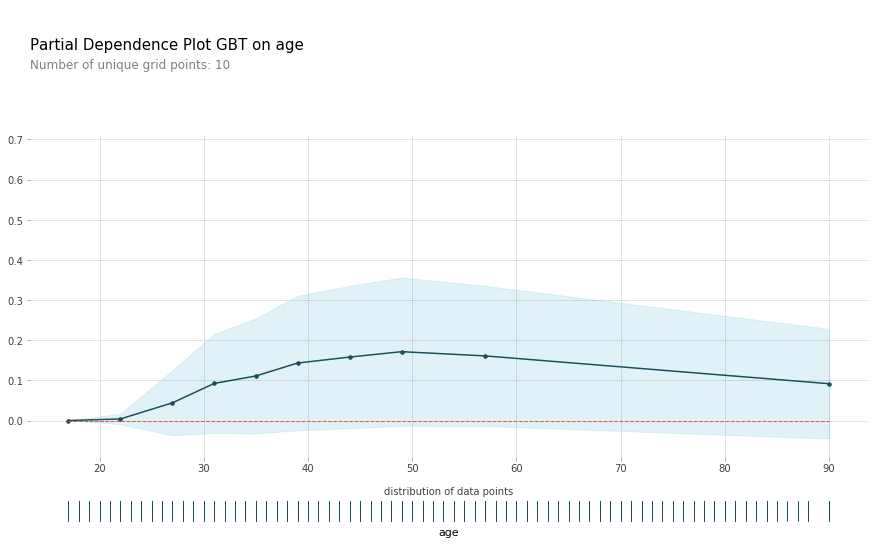

In [ ]:
plot_pdp(black_box, 'GBT', X_train, 'age')

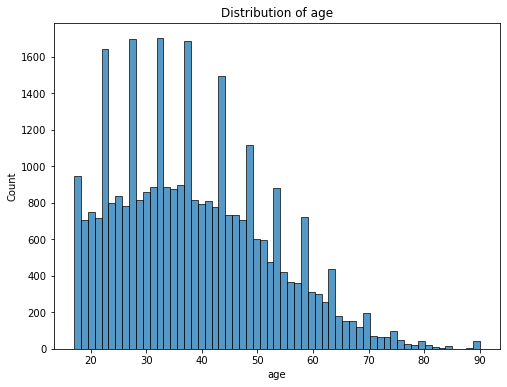

In [ ]:
feature_hist = 'age'
plt.figure(figsize=(8,6))
sns.histplot(X_train[feature_hist])
plt.title(f'Distribution of {feature_hist}')
plt.show()

As for `age` we find a postive relationship to income from an age of 25. This trend flattens the higher the age for both the large decision tree and GBT. For GBT the there is even a slight negative relationship to income from 50 onwards. But again, the amount of data for older people is low and therefore this observation is not reliable.

<a id='2.2_Local_Interpretability_Frameworks'></a>
## 2.2 Local Interpretability Frameworks


<a id='2.2.1_SHAP'></a>
### 2.2.1 SHAP

SHAP (SHapley Additive exPlanations) is a method to explain individual predictions [[1, Chapter 9.6] ](https://christophm.github.io/interpretable-ml-book/shap.html). SHAP is based on the game theoretic concept of Shapley Values. SHAP can help explain predicitons on a local level meaning individal samples. Let us randomly pick instance 4 in the test data and analyse it using SHAP. I will apply SHAP to the black box model GBT as it is the hardest to interpret and SHAP can give valuable insights

In [ ]:
instance = df_test.iloc[[3]]
instance

,age,workclass,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,y
4,44,Private,Some-college,10,married,1,Husband,Black,0,7688,0,40,usa,1


Some key characteristics of instance 4:
- age: 44
- workclass: private sector
- year in education: 10
- married: yes
- capital-gain: 7688
- native-country: usa
- **income: >50K**

In [58]:
explainer_dt_small = shap.TreeExplainer(dt_small)
explainer_dt_large = shap.TreeExplainer(dt_large)
explainer_black_box = shap.TreeExplainer(black_box)

shap_values_dt_small = explainer_dt_small.shap_values(X_test)
shap_values_dt_large = explainer_dt_large.shap_values(X_test)
shap_values_black_box = explainer_black_box.shap_values(X_test)

In [ ]:
shap.initjs()
shap.force_plot(explainer_black_box.expected_value, shap_values_black_box[3,:], X_test.iloc[3,:], matplotlib=True)


We find that the high value of `capital-gain` (7688) has the highest impact on correctly predicting high income (>50K). Appart from that being married and aged 44 also have positive impact on the prediction. Being female (sex=0), however, led to slight tendency to predict lower income. The same analysis can be made to any other instance in the dataset. Let us look at more global approaches using SHAP.

In [ ]:
shap.initjs()
shap.force_plot(explainer_black_box.expected_value, shap_values_black_box[:1000,:], X_test.iloc[:1000,:])


This is an interactive plot using SHAP on the GBT classifier. It groups samples by similarity. Hovering over the plot with the mouse we can identify common characteristics.

- **Red group on the left**: People predicted as high income commonly have high capital-gain (>7000) and are mostly married.

- **Red peak in the middle**: People share high number of years in education (> 13) and being married.

- **Blue valley in the middle**: Samples are predicted as low income. They share low age (< 25) and not being married, and low number of hours per week (< 30).

This plot is extremely helpful to identify common charateristcs and to explain a models prediction. Note that it is computationally very expensive. Thus we only plot 1000 samples from the test set. (Full set would take multiple minutes to compute)

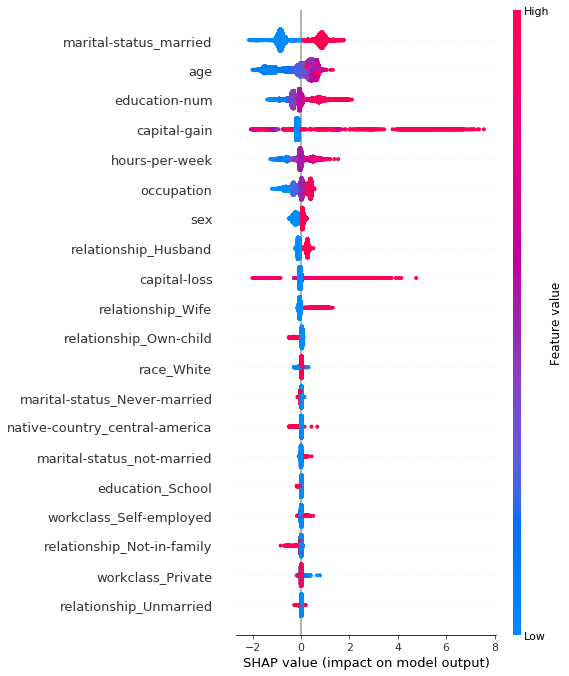

In [ ]:
shap.summary_plot(shap_values_black_box, X_test)


In this summary plot we find the especially being married, longer education as well as higher age lead to high income predicitons for the GBT classifier. High capital-gain also tend to result in higher income predictions. Again these relations are not causal and particularily facts on marriage most probably hide confounder variables (e.g. gender, finaical stability, having children, etc.)

<a id='2.2.2_LIME'></a>
### 2.2.2 LIME

LIME standw for Local interpretable model-agnostic explanations. It uses surrogate models

"*Surrogate models are trained to approximate the predictions of the underlying black box model. Instead of training a global surrogate model, LIME focuses on training local surrogate models to explain individual predictions*" [[1, Chapter 9.2]](https://christophm.github.io/interpretable-ml-book/lime.html)

Let us perform LIME on the GBT again. The same would apply to the Decision Trees. Again we try to explain instance number 4

In [ ]:
explainer = LimeTabularExplainer(np.array(X_train), feature_names=list(X_train.columns), class_names=['<=50K', '>50K'], mode='classification')
instance = X_test.iloc[3]
exp = explainer.explain_instance(instance, black_box.predict_proba)
exp.show_in_notebook(show_table=True)

Here we can see that GBT predicts with 98% certainty that sample number 4 has >50K income. Addiontally we can see the most important featues that contributed to that predition, namely high capital-gain at most. Additionally we can find the the feature values for this sample on the right table and whether a feature had positve impact on the income prediction (orange) or negative impact (blue). The same anaysis could be made for the other claassifiers and various instances

Let's use LIME on the same instance using the Decision Trees

In [ ]:
explainer = LimeTabularExplainer(np.array(X_train), feature_names=list(X_train.columns), class_names=['<=50K', '>50K'], mode='classification')
instance = X_test.iloc[3]
exp = explainer.explain_instance(instance, dt_small.predict_proba)
exp.show_in_notebook(show_table=True)

In [ ]:
explainer = LimeTabularExplainer(np.array(X_train), feature_names=list(X_train.columns), class_names=['<=50K', '>50K'], mode='classification')
instance = X_test.iloc[3]
exp = explainer.explain_instance(instance, dt_large.predict_proba)
exp.show_in_notebook(show_table=True)

We find similar explanations for the decision trees. However the fact that  this instance is married had higher positive impact on the prediction for the decision trees than for GBT



---



<a id='3_Error_Analysis'></a>
# 3 Error Analysis

<a id='3.1_Fairness_Assessment_of_Existing_Models'></a>
## 3.1 Fairness Assessment of Existing Models


First we identify senitive features:
- `sex`
- `race`

Additionally we can study the intersection of `sex` and `race`.

In [66]:
sex_train = df_train_pre_encoding['sex']
sex_test = df_test_pre_encoding['sex']

race_train = df_train_pre_encoding['race']
race_test = df_test_pre_encoding['race']

intersection_train = df_train_pre_encoding[['sex', 'race']]
intersection_test = df_test_pre_encoding[['sex', 'race']]

As a fairness metrics I choose **selection_rate** from the [fairlearn](https://fairlearn.org/) framework. It calculates the fraction of predicted labels matching the ‘good’ outcome, which is >50K income in this case. We can also think of the good outcome as a high credit score since this data could be used for that as well. We will analyse the Large Decision Tree first, then the small Decision Tree and then the Black box model (GBT)

**Large Decision Tree**

In [67]:
# ideas from https://fairlearn.org/main/auto_examples/plot_grid_search_census.html
def plot_fairness(model, model_name, sensitive_features_test, sensitive_features_names, print_report=False):
  # Defining the metrics
  metric_frame = MetricFrame(
      metrics={
          "selection_rate": selection_rate,
          "balanced_accuracy": balanced_accuracy_score,
          "count": count,
      },
      sensitive_features=sensitive_features_test,
      y_true=y_test,
      y_pred=model.predict(X_test),
  )
  if print_report:
    print(metric_frame.by_group)
  metric_frame.by_group.plot.bar(
      subplots=True,
      layout=[3, 1],
      legend=False,
      figsize=[12, 8],
      title=f"{model_name} grouped by {sensitive_features_names}",
  )
  plt.show()

# we need a differnt plot method for the fair model because we use a ThresholdOptimizer for postprocessing a model
# it requires the sensitive features for predicting
def plot_fairness_fair_model(model, model_name, sensitive_features_test, sensitive_features_names, print_report=False, no_count=False):

  # Doesnt show the count plot
  if no_count:
      metric_frame = MetricFrame(
        metrics={
            "selection_rate": selection_rate,
            "balanced_accuracy": balanced_accuracy_score,
        },
        sensitive_features=sensitive_features_test,
        y_true=y_test,
        y_pred=model.predict(X_test, sensitive_features=sensitive_features_test),
    )
  else:
    metric_frame = MetricFrame(
        metrics={
            "selection_rate": selection_rate,
            "balanced_accuracy": balanced_accuracy_score,
            "count": count,
        },
        sensitive_features=sensitive_features_test,
        y_true=y_test,
        y_pred=model.predict(X_test, sensitive_features=sensitive_features_test),
    )

  #prints concrete numbers
  if print_report:
    print(metric_frame.by_group)

  #plotting the results
  metric_frame.by_group.plot.bar(
      subplots=True,
      layout=[3, 1],
      legend=False,
      figsize=[12, 8],
      title=f"{model_name} grouped by {sensitive_features_names}",
  )
  plt.show()


        selection_rate  balanced_accuracy    count
sex                                               
Female        0.059410           0.705362   5420.0
Male          0.227616           0.750474  10856.0


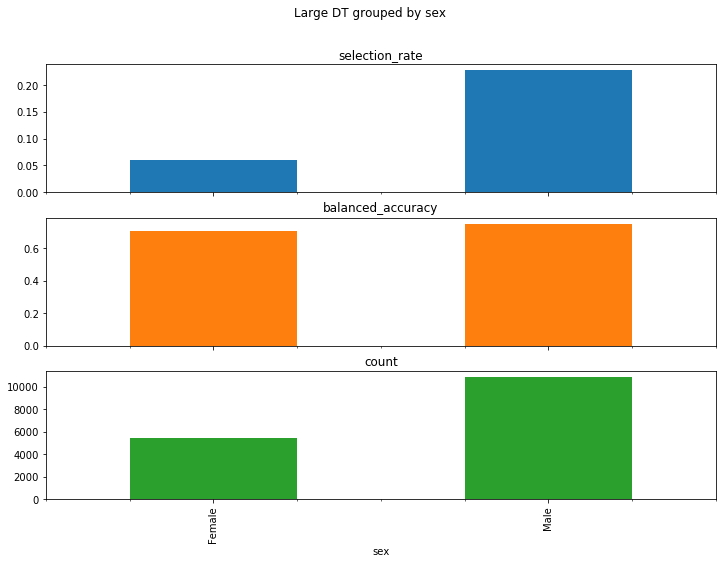

In [ ]:
plot_fairness(model=dt_large,
              model_name="Large DT",
              sensitive_features_test=sex_test,
              sensitive_features_names="sex",
              print_report=True,
              )

       selection_rate  balanced_accuracy    count
race                                             
Black        0.076874           0.721612   1561.0
Other        0.192506           0.767084    774.0
White        0.181049           0.750570  13941.0


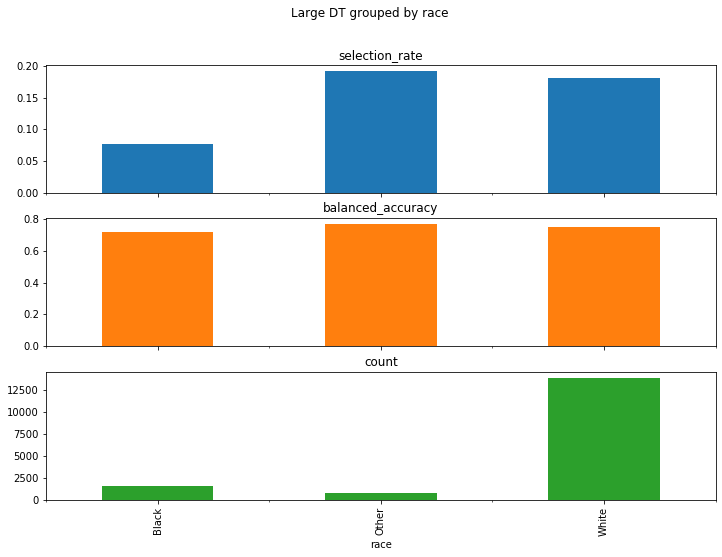

In [ ]:
plot_fairness(model=dt_large,
              model_name="Large DT",
              sensitive_features_test=race_test,
              sensitive_features_names="race",
              print_report=True
              )

              selection_rate  balanced_accuracy   count
sex    race                                            
Female Black        0.033201           0.658931   753.0
       Other        0.081272           0.754666   283.0
       White        0.062500           0.705929  4384.0
Male   Black        0.117574           0.736846   808.0
       Other        0.256619           0.758028   491.0
       White        0.235430           0.749687  9557.0


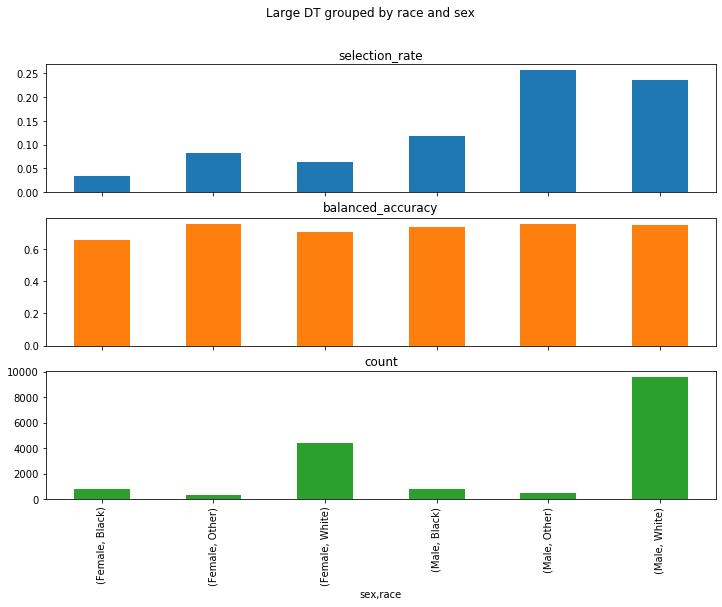

In [ ]:
plot_fairness(model=dt_large,
              model_name="Large DT",
              sensitive_features_test=intersection_test,
              sensitive_features_names="race and sex",
              print_report=True
              )

**Large Decision Tree Summary**:

Looking at the `selection_rate` (blue) men are almost four times as likely to be predicted high income compared to women. Additionally White people are more than twice as likely to be predicted high income compared to other race.

As for intersectionality white men have a selection rate twice as high as all other combinations of features (execpt from (Male,Other))

Assuming the model would be deployed for credit score prediction this disparity would not be acceptable from a fariness point of view. The balanced accuracy is pretty fair accross both features.

**Small Decision Tree**

        selection_rate  balanced_accuracy    count
sex                                               
Female        0.064760           0.710919   5420.0
Male          0.206245           0.718796  10856.0


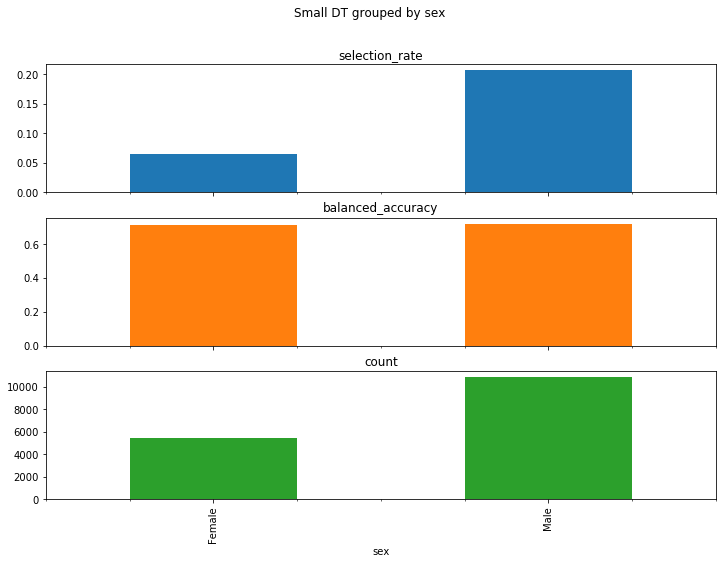

In [ ]:
plot_fairness(model=dt_small,
              model_name="Small DT",
              sensitive_features_test=sex_test,
              sensitive_features_names="sex",
              print_report=True
              )

       selection_rate  balanced_accuracy    count
race                                             
Black        0.071749           0.705576   1561.0
Other        0.196382           0.735272    774.0
White        0.166846           0.723541  13941.0


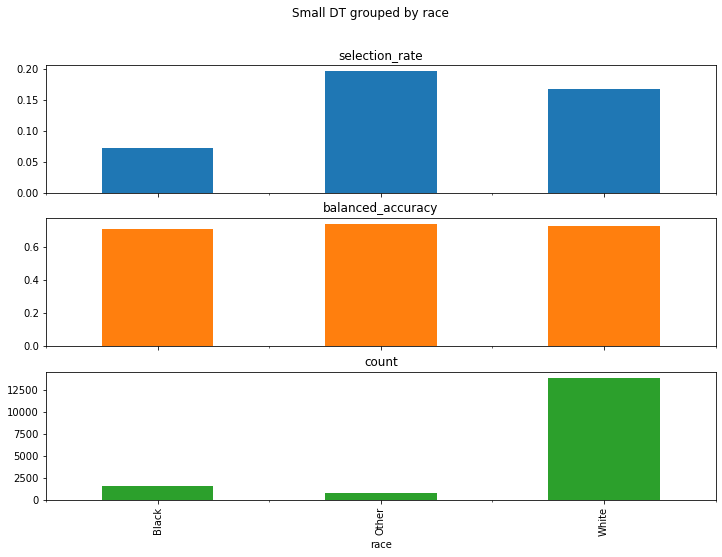

In [ ]:
plot_fairness(model=dt_small,
              model_name="Small DT",
              sensitive_features_test=race_test,
              sensitive_features_names="race",
              print_report=True
              )

              selection_rate  balanced_accuracy   count
sex    race                                            
Female Black        0.033201           0.684147   753.0
       Other        0.098940           0.694484   283.0
       White        0.067974           0.713848  4384.0
Male   Black        0.107673           0.707648   808.0
       Other        0.252546           0.736235   491.0
       White        0.212200           0.717512  9557.0


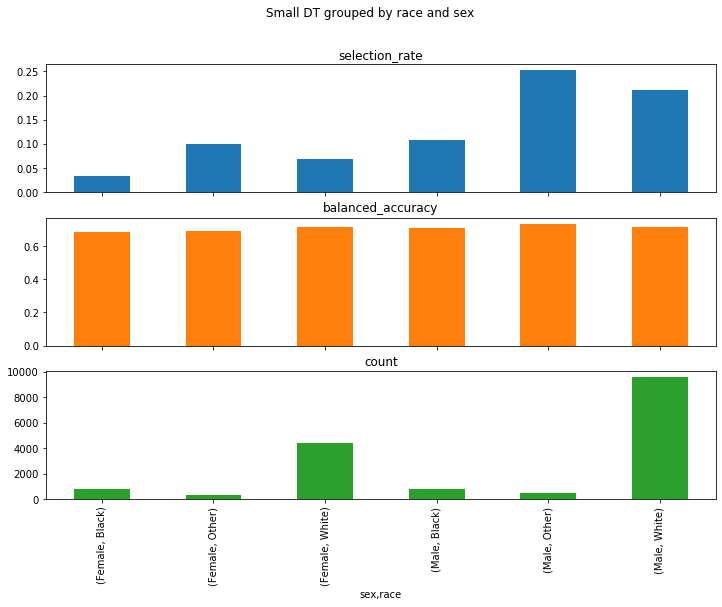

In [ ]:
plot_fairness(model=dt_small,
              model_name="Small DT",
              sensitive_features_test=intersection_test,
              sensitive_features_names="race and sex",
              print_report=True
              )

**Small Decision Tree Summary**:

Again we identify a strong bias against women and black black people in the `selection_rate`. As compared to the large decision tree the diffenrence in `selection_rate` is slitghly less but still significant. Both models perform similarily unfair on sex and race intersectionality.

**GBT**

        selection_rate  balanced_accuracy    count
sex                                               
Female        0.083764           0.767776   5420.0
Male          0.161385           0.722758  10856.0


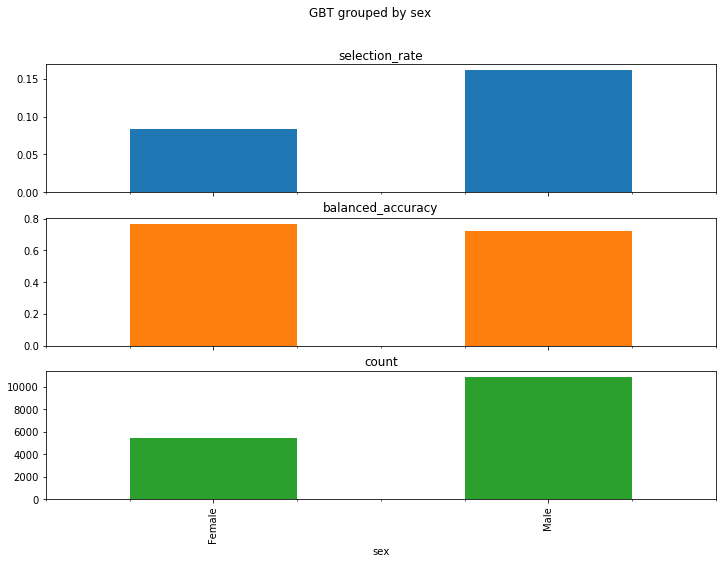

In [ ]:
plot_fairness(model=black_box,
              model_name="GBT",
              sensitive_features_test=sex_test,
              sensitive_features_names="sex",
              print_report=True
              )

       selection_rate  balanced_accuracy    count
race                                             
Black        0.062140           0.711003   1561.0
Other        0.140827           0.727337    774.0
White        0.143462           0.730538  13941.0


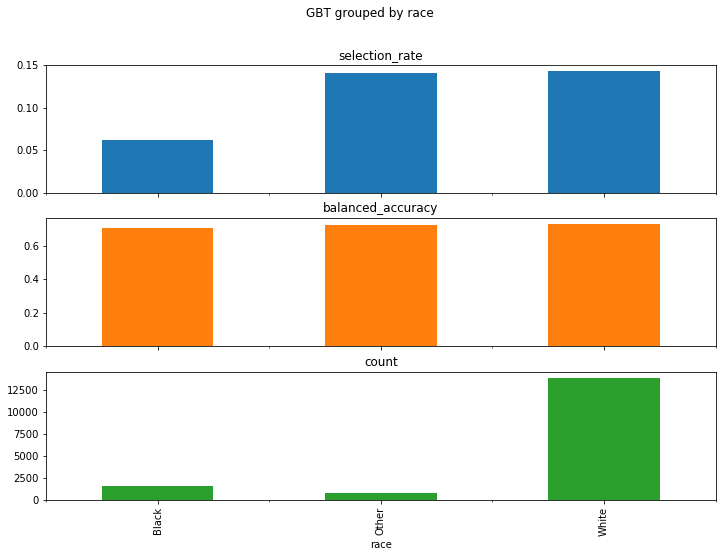

In [ ]:
plot_fairness(model=black_box,
              model_name="GBT",
              sensitive_features_test=race_test,
              sensitive_features_names="race",
              print_report=True
              )

              selection_rate  balanced_accuracy   count
sex    race                                            
Female Black        0.035857           0.670133   753.0
       Other        0.095406           0.746634   283.0
       White        0.091241           0.776705  4384.0
Male   Black        0.086634           0.724711   808.0
       Other        0.167006           0.722581   491.0
       White        0.167417           0.722216  9557.0


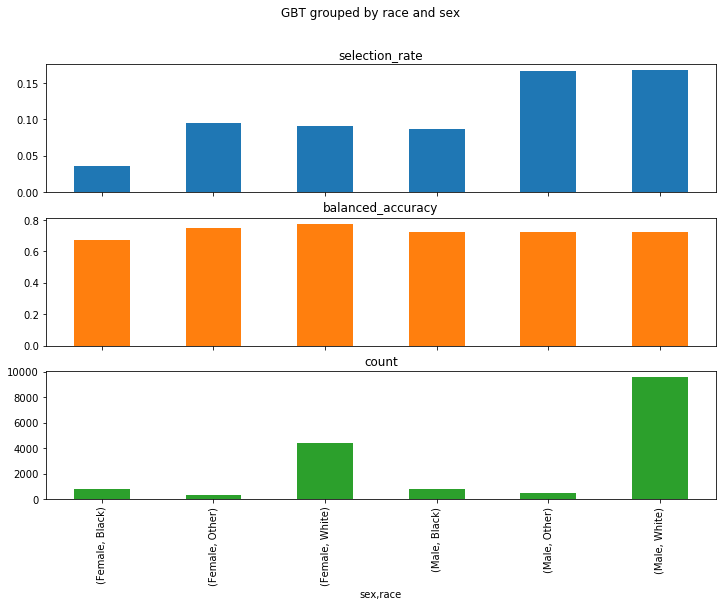

In [ ]:
plot_fairness(model=black_box,
              model_name="GBT",
              sensitive_features_test=intersection_test,
              sensitive_features_names="race and sex",
              print_report=True
              )

**GBT Summary**:

Also the black box model is biased towards men when it comes to income prediction. Male are about twice as likely to be predicted high income than female. Compared to the Decision Trees that is much more fair but still inacceptable. On intersectionality the black box model is also slightly more fair than the Decision Trees.

<a id='3.2_Least_Fair_Model'></a>
## 3.2 Least Fair Model

We conclude that the **Large Decision Tree** is the **least fair model**.

The disparity in selection for race and sex and their intersection are higher than the other two model.

In [ ]:
print('Least Fair Model: ', str(dt_large))
print('Balanced Accuracy: ', round(balanced_accuracy_score(dt_large.predict(X_test),y_test),3))
print('Difference in Selection Rate on intersection: ', round(selection_rate_difference(y_test, dt_large.predict(X_test), sensitive_features=intersection_test),3))

Least Fair Model:  DecisionTreeClassifier(max_depth=10, min_samples_split=1000, random_state=1)
Balanced Accuracy:  0.819
Difference in Selection Rate on intersection:  0.223


In [ ]:
pd_least_fair = pd.DataFrame.from_dict([{'Model': dt_large,
              'Balanced Accuracy': balanced_accuracy_score(dt_large.predict(X_test),y_test),
              'Difference in Selection Rate': selection_rate_difference(y_test, dt_large.predict(X_test), sensitive_features=intersection_test)
              }])

# Printing the full row
pd.set_option('max_colwidth', 100)
pd_least_fair

,Model,Balanced Accuracy,Difference in Selection Rate
0,"DecisionTreeClassifier(max_depth=10, min_samples_split=1000, random_state=1)",0.818539,0.223419


One **interesting observation** is that even though `sex` and `race` were almost not involved in the prediction (e.g. see feature importance section) all models are strongly biased against those sensitive features. This shows that **simply droping sensitive features from the data does not help making models more fair**. The reason is that the other features are still correlated with those sensitive features. (e.g. `marital-status` and `sex`).

<a id='3.3_Mititgations'></a>
## 3.3 Mitigations

Now we use the **ThresholdOptimizer** ([documentation](https://fairlearn.org/v0.5.0/api_reference/fairlearn.postprocessing.html)) from the fairlearn framework to find a model that mitigates the fairness issues discovered previously.

ThresholdOptimizer is a postprocessing technique that takes a fitted model and a set of sensitive features as input This way the model's preditions are adjusted to fulfill specified parity constraints. Since we use `selection_rate` as a fairness metric we choose `selection_rate_parity` as a constraint. Therefore the model is optimized on equal opportunities independent of a sensitive feature.

We postprocess all three existing models given the intersection of `race` and `sex` and then conclude which model is the most fair one.

In [70]:
# Initializing the ThresholdOptimizer object.
dt_large_fair = ThresholdOptimizer(estimator=dt_large, constraints="selection_rate_parity",objective='balanced_accuracy_score')

# Fitting the new model given the sensitive features
dt_large_fair.fit(X_train, y_train, sensitive_features=intersection_train)

# Predicting giving the sensitive features
y_pred_dt_large_fair = dt_large_fair.predict(X_test, sensitive_features=intersection_test)


In [71]:
# Initializing the ThresholdOptimizer object.
dt_small_fair = ThresholdOptimizer(estimator=dt_small, constraints="selection_rate_parity",objective='balanced_accuracy_score')

# Fitting the new model given the sensitive features
dt_small_fair.fit(X_train, y_train, sensitive_features=intersection_train)

# Predicting giving the sensitive features
y_pred_dt_small_fair = dt_small_fair.predict(X_test, sensitive_features=intersection_test)


In [72]:
# Initializing the ThresholdOptimizer object.
black_box_fair = ThresholdOptimizer(estimator=black_box, constraints="selection_rate_parity",objective='balanced_accuracy_score')

# Fitting the new model given the sensitive features
black_box_fair.fit(X_train, y_train, sensitive_features=intersection_train)

# Predicting giving the sensitive features
y_pred_black_box_fair = black_box_fair.predict(X_test, sensitive_features=intersection_test)


              selection_rate  balanced_accuracy
sex    race                                    
Female Black        0.237716           0.588457
       Other        0.268551           0.681668
       White        0.241560           0.667320
Male   Black        0.220297           0.692577
       Other        0.256619           0.758028
       White        0.235743           0.749703


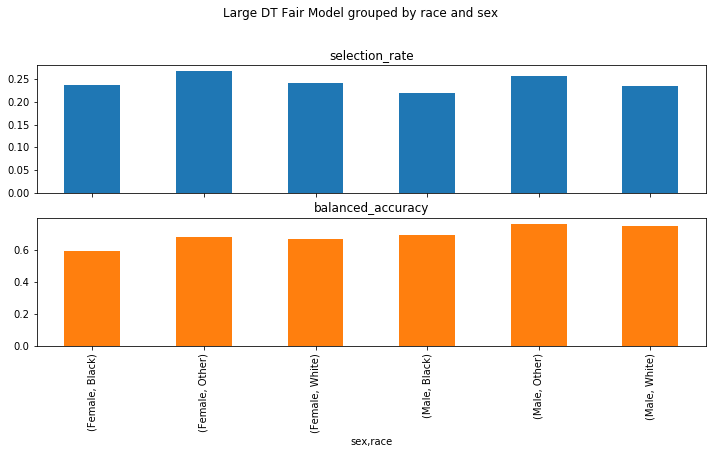

In [ ]:
plot_fairness_fair_model(model=dt_large_fair,
              model_name="Large DT Fair Model",
              sensitive_features_test=intersection_test,
              sensitive_features_names="race and sex",
              print_report=True,
              no_count=True,
              )

              selection_rate  balanced_accuracy
sex    race                                    
Female Black        0.247012           0.621358
       Other        0.233216           0.651606
       White        0.217153           0.680042
Male   Black        0.216584           0.677233
       Other        0.211813           0.690971
       White        0.212828           0.717300


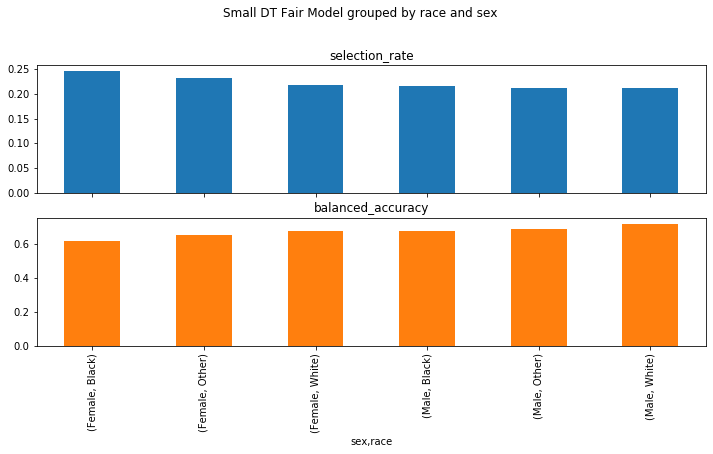

In [ ]:
plot_fairness_fair_model(model=dt_small_fair,
              model_name="Small DT Fair Model",
              sensitive_features_test=intersection_test,
              sensitive_features_names="race and sex",
              print_report=True,
              no_count=True,
              )

              selection_rate  balanced_accuracy
sex    race                                    
Female Black        0.253652           0.643058
       Other        0.289753           0.736475
       White        0.261405           0.713381
Male   Black        0.215347           0.704347
       Other        0.189409           0.706776
       White        0.166998           0.721788


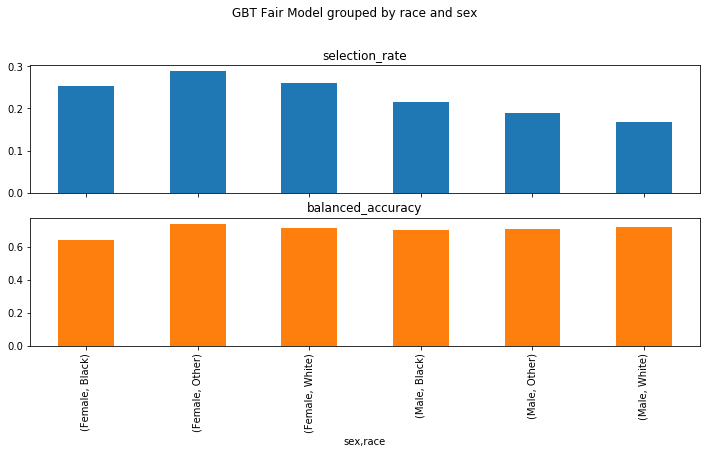

In [ ]:
plot_fairness_fair_model(model=black_box_fair,
              model_name="GBT Fair Model",
              sensitive_features_test=intersection_test,
              sensitive_features_names="race and sex",
              print_report=True,
              no_count=True,
              )

**Comparision of Fair Models**:

The mitigated models all perform more fair in terms of `selection_rate` than the unmitigated ones. However there is a significatn decrease in accuracy. Interestingly the **GBT** is now slightly biased against men. **Both decision trees** perform very fair on the intersection of `race` and `sex`.

<a id='3.4_Accuracy_Fairness_Tradeoff'></a>
## 3.4 Accuracy Fairness Tradeoff

In [74]:
classifiers = [dt_large, dt_small, black_box]
classifiers_fair = [dt_large_fair, dt_small_fair, black_box_fair]
classifiers_names = ['Large DT', 'Small DT', 'GBT', 'Fair Large DT', 'Fair Small DT', 'Fair GBT']

# saving the performances
accuracies = []

# saving selection rate parities
parities = []

for clf in classifiers:
  y_pred = clf.predict(X_test)
  acc = balanced_accuracy_score(y_pred, y_test)
  parity = selection_rate_difference(y_test, y_pred, sensitive_features=intersection_test)
  parities.append(parity)
  accuracies.append(acc)

for clf in classifiers_fair:
  y_pred = clf.predict(X_test, sensitive_features=intersection_test)
  acc = balanced_accuracy_score(y_pred, y_test)
  parity = selection_rate_difference(y_test, y_pred, sensitive_features=intersection_test)
  parities.append(parity)
  accuracies.append(acc)

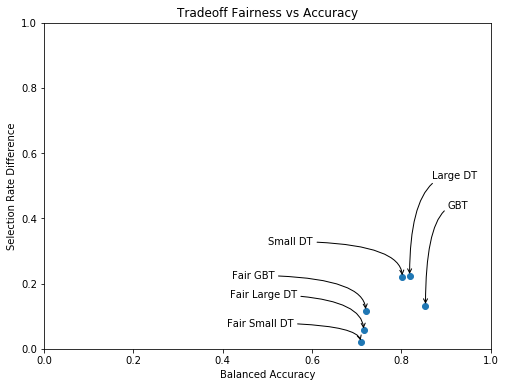

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.scatter(accuracies, parities)

#Annotating the scatter points
ax.annotate(classifiers_names[0], (accuracies[0], parities[0]), xytext=(accuracies[0]+0.05, parities[0]+0.3),
    arrowprops = dict(arrowstyle="->",
                        connectionstyle="angle3,angleA=0,angleB=-90"))
ax.annotate(classifiers_names[1], (accuracies[1], parities[1]), xytext=(accuracies[1]-0.3, parities[1]+0.1),
    arrowprops = dict(arrowstyle="->",
                        connectionstyle="angle3,angleA=0,angleB=-90"))
ax.annotate(classifiers_names[2], (accuracies[2], parities[2]), xytext=(accuracies[2]+0.05, parities[2]+0.3),
    arrowprops = dict(arrowstyle="->",
                        connectionstyle="angle3,angleA=0,angleB=-90"))
ax.annotate(classifiers_names[3], (accuracies[3], parities[3]), xytext=(accuracies[3]-0.3, parities[3]+0.1),
    arrowprops = dict(arrowstyle="->",
                        connectionstyle="angle3,angleA=0,angleB=-90"))
ax.annotate(classifiers_names[4], (accuracies[4], parities[4]), xytext=(accuracies[4]-0.3, parities[4]+0.05),
    arrowprops = dict(arrowstyle="->",
                        connectionstyle="angle3,angleA=0,angleB=-90"))
ax.annotate(classifiers_names[5], (accuracies[5], parities[5]), xytext=(accuracies[5]-0.3, parities[5]+0.1),
    arrowprops = dict(arrowstyle="->",
                        connectionstyle="angle3,angleA=0,angleB=-90"))
plt.ylim(0,1)
plt.xlim(0,1)
plt.xlabel('Balanced Accuracy')
plt.ylabel('Selection Rate Difference')
plt.title('Tradeoff Fairness vs Accuracy')
plt.show()

We find that there is a trade off between accuracy and fairness. All mitigated models perform worse on the test set in terms of balanced accurcy compared to the unmitageted models. On the other hand all mitigated models have a lower difference in selection rate and are therefore more fair than others. Looking at pareto optimality all models are dominted by **Fair Small DT** and **GBT**.

<a id='3.5_Most_Fair_Model'></a>
## 3.5 Most Fair Model

From the plot above we find that the **Fair Small Decision Tree** is the **most fair model**. It is more fair at the cost of accuracy. For a credit score system, however, fairness might be more crucial than accuracy.

In [ ]:
pd_most_fair = pd.DataFrame.from_dict([{'Model': dt_small_fair,
              'Balanced Accuracy': balanced_accuracy_score(dt_small_fair.predict(X_test, sensitive_features=intersection_test),y_test),
              'Difference in Selection Rate': selection_rate_difference(y_test, dt_small_fair.predict(X_test, sensitive_features=intersection_test), sensitive_features=intersection_test)
              }])
# Printing the full row
pd.set_option('max_colwidth', 300)
pd_most_fair

,Model,Balanced Accuracy,Difference in Selection Rate
0,"ThresholdOptimizer(constraints='selection_rate_parity',\n estimator=DecisionTreeClassifier(max_depth=3,\n random_state=1),\n objective='balanced_accuracy_score')",0.710012,0.031483


Comparing the least and the most fair model side by side:

In [ ]:
pd_overview = pd.concat([pd_least_fair, pd_most_fair])
pd_overview

,Model,Balanced Accuracy,Difference in Selection Rate
0,"DecisionTreeClassifier(max_depth=10, min_samples_split=1000, random_state=1)",0.818539,0.223419
0,"ThresholdOptimizer(constraints='selection_rate_parity',\n estimator=DecisionTreeClassifier(max_depth=3,\n random_state=1),\n objective='balanced_accuracy_score')",0.710012,0.031483


<a id='3.6_Potential_sources_of_Bias_in_the_Data'></a>
## 3.6 Potential sources of Bias in the Data

As for all Machine Learning Models they can only be as good as the data they are trained on. So most probably the unmitigated models take over biases that already exist in the data. In this section we will analyse the data for biases and fairness. Apart from `race` and `sex` we will also include `native-country` in this analysis.

First of all we try to identify any **sampling biases** in the dataset

In [79]:
# defining sensitive features. Let us also include native-country
sensitives = ['sex', 'race', 'native-country']

#Analysing the full data
full_data = pd.concat([df_train_pre_encoding, df_test_pre_encoding])

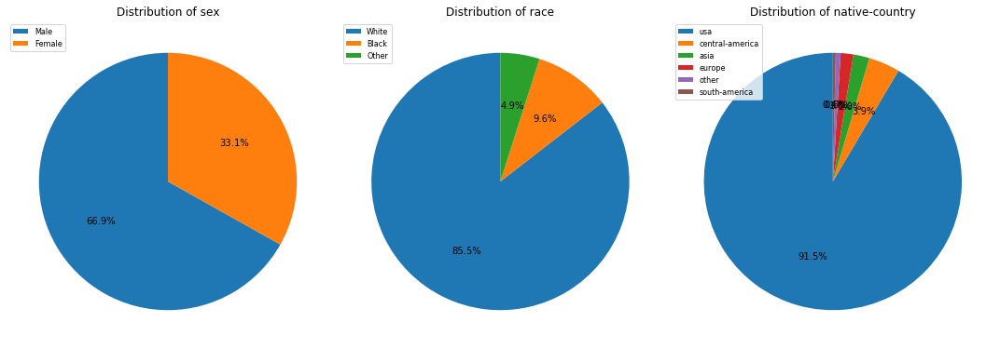

In [ ]:
plt.figure(figsize=(15,10))
for i,sensitive in enumerate(sensitives):
  # We are using the string categories for better readability
  counts = full_data[sensitive].value_counts()
  labels = counts.index
  plt.subplot(1,len(sensitives),i+1)
  plt.pie(counts, startangle=90, autopct='%1.1f%%')
  plt.legend(labels, loc=2,fontsize=8)
  plt.title(f"Distribution of {sensitive}")
  plt.tight_layout()
  plt.plot()

Key observations:
- Men are strongly overrepresented in the data.
- Race representation is more accurate but as of 2022 only 75% are white and 13% are black which makes white people overrepresented and black people underreprented [[4]](https://www.census.gov/quickfacts/fact/table/US). Note that the data is from the Cencus 1994.
- The distribution for native-country seems to be representative. Comparing to this report [[5]](https://sgp.fas.org/crs/homesec/IF11806.pdf) we find that at 1994 roughly 92% were in the US and 8% were foreign born.

Accoring to the survey on Bias and Fairness [[2]](https://arxiv.org/pdf/1908.09635.pdf) we have found **Sampling Bias** in the data

Now we can analyse the **prevalence** for sensitve features. Assuming fair data the proportion in the population for high vs. low income  should be the same regardless of race, sex or native country. We can test that by comparing prevalencess for different features

In [ ]:
# Similar to Lab 1
df_fair = full_data[['race','sex', 'native-country']]

#Define protected features 
df_fair['priv_race'] = [1 if r=='White' else 0 for r in df_fair['race']]
df_fair['priv_sex'] = [1 if s=='Male' else 0 for s in df_fair['sex']]
df_fair['priv_native_country'] = [1 if s=='usa' else 0 for s in df_fair['native-country']]

#Define target variable 
df_fair['y'] =  [1 if y == '>50K'else 0 for y in full_data['y']]

#Saving results in prevalences and plotting them later
prevalences = []

#Calculate the prevelance of target variable of y
prev = df_fair['y'].mean()
prevalences.append(prev)

####
#Calculate the prevelance of priv_race with respect to y
prev_race = df_fair.groupby('priv_race')['y'].mean().values
prevalences.append(prev_race[0])
prevalences.append(prev_race[1])

####
#Calculate the prevelance of priv_Sex with respect to y
prev_sex = df_fair.groupby('priv_sex')['y'].mean().to_numpy()
prevalences.append(prev_sex[0])
prevalences.append(prev_sex[1])

####
#Calculate the prevelance of priv_native_country with respect to y
prev_native_country = df_fair.groupby('priv_native_country')['y'].mean().to_numpy()
prevalences.append(prev_native_country[0])
prevalences.append(prev_native_country[1])

####
#Calculate the combined prevelance of priv_race, priv_sex with and priv_native_country respect to y
prev_comb = df_fair.groupby(['priv_race','priv_sex', 'priv_native_country'])['y'].mean()

#normalizing prev_comb
prev_comb_vector = prev_comb.to_numpy()
prev_comb_vector_normalized = prev_comb_vector / sum(prev_comb_vector)

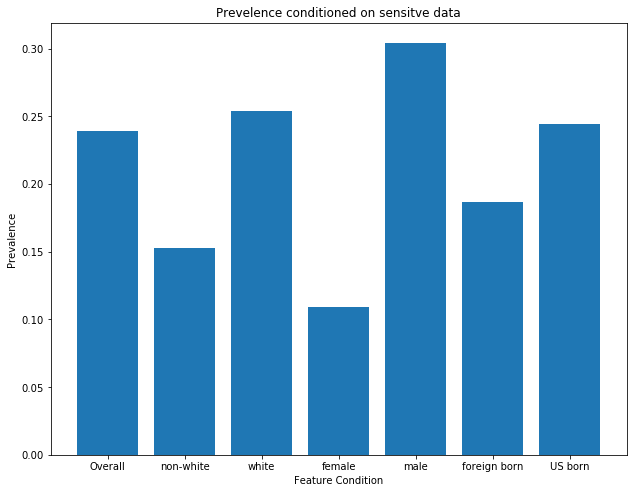

In [ ]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_axes([0,0,1,1])
prevalences
categories = ['Overall', 'non-white', 'white', 'female', 'male', 'foreign born', 'US born']
ax.bar(categories,prevalences)
plt.xlabel('Feature Condition')
plt.ylabel('Prevalence')
plt.title('Prevelence conditioned on sensitve data')
plt.show()

We can see that for the white and male population the prevalence (i.e. the proportion of income) for >50K income is higher than for the overall population. Furthermore the proportion for higher income for back, female and foreign born population is significantly lower than the overall population. Consequently the data is biased with respect to prevalence

[]

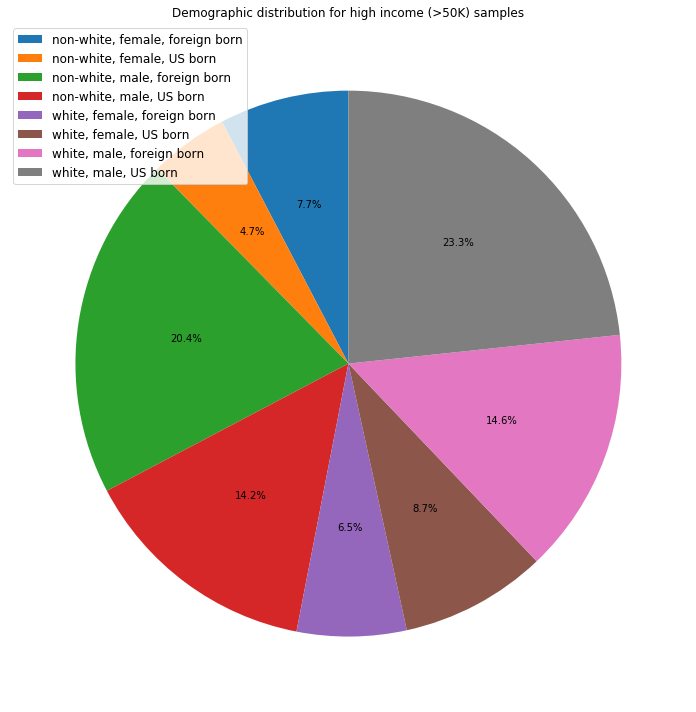

In [ ]:
labels = ['non-white, female, foreign born',
          'non-white, female, US born',
          'non-white, male, foreign born',
          'non-white, male, US born',
          'white, female, foreign born',
          'white, female, US born',
          'white, male, foreign born',
          'white, male, US born',
]

plt.figure(figsize=(15,10))
plt.pie(prev_comb_vector_normalized, startangle=90, autopct='%1.1f%%')
plt.legend(labels, loc=2,fontsize=12)
plt.title('Demographic distribution for high income (>50K) samples')
plt.tight_layout()
plt.plot()

Here we can see the distribution of the intersection of sensitve demographics conditioned on the high income (>50K) class. We find that almost one in four of those with high income are white, male and US born. Also, all female categories are underrepresented in the high income class (< 10% each)

Accoring to the survey on Bias and Fairness [[2]](https://arxiv.org/pdf/1908.09635.pdf) we have found **Historical Bias** in the data.

It is really hard to mitigate **historical biases**. For example the fact that women are paid less is a complex economic and political problem which is hard to fix. As for the **sampling biases**, however, there are many techniques to ensure that there is no under or overrepresentation in the data (e.g. the imbalance in gender could easily be mitigated using the cluster sampling technique)

<a id='4_What_if_Counterfactuals'></a>
# 4 What-if Counterfactuals? 


For the counterfactual analysis I am using the [Dice_ml](https://github.com/interpretml/DiCE) framework. It allows us to change certain features such that the models output changes from low income to high income or vice versa. This way we can find out how an individual would need to change in order to change the model's prediction. As actionalbe feature we specify:

- `education-num`
- `hours-per-week`

We restrict the range of the features to this maximun and minimum occurance in the whole dataset. This way we ensure no unrealistic counterfactuals.

Unfortunately the ml_dice framework only supports models built from common libraries such as sklearn or tensorflow. The fair model we have built is postprocessed using fairlearn specic package and is therefore not supported in the dice_ml framework. We can still do some manual analysis.

<a id='4.1_Using_the_least_fair_model'></a>
## 4.1 Using the least fair model

In [83]:
# Recombining X_train and y_train to create the Dice data
data = pd.concat([X_train, y_train], axis=1)

# Dataset for training an ML model using the dice_ml.Data object
dice_data = Data(dataframe=data,
                 continuous_features=['age',
                                      'education-num',
                                      'occupation',
                                      'capital-gain',
                                      'capital-loss',
                                      'hours-per-week',
                                      'sex'
                                      ],
                 outcome_name='y')

In [84]:
# creating a dice_ml.Model object for the least fair model
dice_dt_large = Model(model=dt_large,
                  backend='sklearn')

In [85]:
# creating a dice_ml.Dice object (explainer) for the least fair model
exp_dt_large = Dice(dice_data,dice_dt_large, method='random')

In [86]:
# here we can retrive a sample and change some features if we want to
def get_instance(sample_id, education_num=None, hours_per_week=None, occupation=None, sex=None, race=None):
  #making sure to not change the original data
  sample = X_test.iloc[[sample_id]].copy()
  if education_num is not None:
    sample['education-num']=education_num
  if hours_per_week is not None:
    sample['hours-per-week']=hours_per_week
  if occupation is not None:
    sample['occupation']=occupation
  if sex is not None:
    sample['sex']=sex
  if race is not None:
    # Race can be 'Black' or 'White'
    if race=='Black':
      sample['race_White'] = 0
      sample['race_Other'] = 0
      sample['race_Black'] = 1
    elif race=='White':
      sample['race_White'] = 1
      sample['race_Other'] = 0
      sample['race_Black'] = 0
    else:
      print('Choose Black or White')
  return sample

In [87]:
# See all columns when plotting a dataframe
pd.set_option('display.max_columns', None)

In [88]:
# this method will visualse some counterfactuals in order to change the prediction of a specific sample
def visualize_cf(explainer, sample_id, features_to_vary, total_CFs, education_num=None, hours_per_week=None, occupation=None, sex=None, race=None):

  # Check a specific sample
  query_instance = get_instance(sample_id, education_num=education_num, hours_per_week=hours_per_week, occupation=occupation, sex=sex, race=race)

  minmax = []

  for feature in features_to_vary:
    minmax.append([min(data[feature]),max(data[feature])])

  permitted_range=dict(zip(features_to_vary,minmax))
  print(permitted_range)

  # Now generating explanations using the predefined features.
  cf = explainer.generate_counterfactuals(query_instance,
                                    total_CFs=total_CFs,
                                    desired_class="opposite",
                                    permitted_range=permitted_range,
                                    features_to_vary=features_to_vary)
  # Visualize it
  cf.visualize_as_dataframe(show_only_changes=True)


**Example 1**

In [ ]:
# feasible features to vary:
features_to_vary=['education-num',
                  #'sex',
                  #'hours-per-week',
                  #'occupation'
                  ]

visualize_cf(explainer=exp_dt_large,
                 sample_id=13,
                 features_to_vary=features_to_vary,
                 total_CFs=5,
                 education_num=None,
                 hours_per_week=None,
                 occupation=None,
                 sex=None,
                 race=None,
             )


{'education-num': [1, 16]}


100%|██████████| 1/1 [00:00<00:00,  6.33it/s]

Query instance (original outcome : 0)


,age,education-num,occupation,sex,capital-gain,capital-loss,hours-per-week,workclass_Goverment-sector,workclass_Private,workclass_Self-employed,workclass_Unemployed,education_Assoc-acdm,education_Assoc-voc,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Prof-school,education_School,education_Some-college,marital-status_Never-married,marital-status_married,marital-status_not-married,relationship_Husband,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Black,race_Other,race_White,native-country_asia,native-country_central-america,native-country_europe,native-country_other,native-country_south-america,native-country_usa,y
0,58,9,4,0,0,0,35,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0



Diverse Counterfactual set (new outcome: 1.0)


,age,education-num,occupation,sex,capital-gain,capital-loss,hours-per-week,workclass_Goverment-sector,workclass_Private,workclass_Self-employed,workclass_Unemployed,education_Assoc-acdm,education_Assoc-voc,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Prof-school,education_School,education_Some-college,marital-status_Never-married,marital-status_married,marital-status_not-married,relationship_Husband,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Black,race_Other,race_White,native-country_asia,native-country_central-america,native-country_europe,native-country_other,native-country_south-america,native-country_usa,y
0,-,11,-,-,-,-,-,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1
1,-,15,-,-,-,-,-,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1
2,-,14,-,-,-,-,-,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1
3,-,16,-,-,-,-,-,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1
4,-,10,-,-,-,-,-,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1


**Example 2**

In [ ]:
# feasible features to vary:
features_to_vary=[#'education-num',
                  #'sex',
                  'hours-per-week',
                  #'occupation'
                  ]
visualize_cf(explainer=exp_dt_large,
                 sample_id=100,
                 features_to_vary=features_to_vary,
                 total_CFs=5,
                 education_num=None,
                 hours_per_week=None,
                 occupation=None,
                 sex=None,
                 race=None,
             )


{'hours-per-week': [1, 99]}


100%|██████████| 1/1 [00:00<00:00,  4.98it/s]

Query instance (original outcome : 0)


,age,education-num,occupation,sex,capital-gain,capital-loss,hours-per-week,workclass_Goverment-sector,workclass_Private,workclass_Self-employed,workclass_Unemployed,education_Assoc-acdm,education_Assoc-voc,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Prof-school,education_School,education_Some-college,marital-status_Never-married,marital-status_married,marital-status_not-married,relationship_Husband,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Black,race_Other,race_White,native-country_asia,native-country_central-america,native-country_europe,native-country_other,native-country_south-america,native-country_usa,y
0,51,10,4,1,0,0,18,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0



Diverse Counterfactual set (new outcome: 1.0)


,age,education-num,occupation,sex,capital-gain,capital-loss,hours-per-week,workclass_Goverment-sector,workclass_Private,workclass_Self-employed,workclass_Unemployed,education_Assoc-acdm,education_Assoc-voc,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Prof-school,education_School,education_Some-college,marital-status_Never-married,marital-status_married,marital-status_not-married,relationship_Husband,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Black,race_Other,race_White,native-country_asia,native-country_central-america,native-country_europe,native-country_other,native-country_south-america,native-country_usa,y
0,-,-,-,-,-,-,96,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1
1,-,-,-,-,-,-,61,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1
2,-,-,-,-,-,-,59,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1
3,-,-,-,-,-,-,75,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1
4,-,-,-,-,-,-,76,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1


**Analysis**

Here we can see two examples where the model predicted low income. However, increasing the number of years in education while holding the other features constant would change the model's prediction to high income (>50K). Similarily the second example shows that for some people increasing the number of hours worked per week can change the models prediction to high income. If this was a real credit score application, one could suggest to invest in further education or increase the working hours in order to have better chances for a high credit score.

**Example 3**

In [ ]:
# feasible features to vary:
features_to_vary=[#'education-num',
                  #'sex',
                  'hours-per-week',
                  #'occupation'
                  ]
visualize_cf(explainer=exp_dt_large,
                 sample_id=7,
                 features_to_vary=features_to_vary,
                 total_CFs=5,
                 education_num=None,
                 hours_per_week=None,
                 occupation=None,
                 sex=None,
                 race=None,
             )


{'hours-per-week': [1, 99]}


100%|██████████| 1/1 [00:00<00:00,  6.18it/s]

Query instance (original outcome : 1)


,age,education-num,occupation,sex,capital-gain,capital-loss,hours-per-week,workclass_Goverment-sector,workclass_Private,workclass_Self-employed,workclass_Unemployed,education_Assoc-acdm,education_Assoc-voc,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Prof-school,education_School,education_Some-college,marital-status_Never-married,marital-status_married,marital-status_not-married,relationship_Husband,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Black,race_Other,race_White,native-country_asia,native-country_central-america,native-country_europe,native-country_other,native-country_south-america,native-country_usa,y
0,63,15,4,0,3103,0,32,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1



Diverse Counterfactual set (new outcome: 0.0)


,age,education-num,occupation,sex,capital-gain,capital-loss,hours-per-week,workclass_Goverment-sector,workclass_Private,workclass_Self-employed,workclass_Unemployed,education_Assoc-acdm,education_Assoc-voc,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Prof-school,education_School,education_Some-college,marital-status_Never-married,marital-status_married,marital-status_not-married,relationship_Husband,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Black,race_Other,race_White,native-country_asia,native-country_central-america,native-country_europe,native-country_other,native-country_south-america,native-country_usa,y
0,-,-,-,-,-,-,12,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
1,-,-,-,-,-,-,31,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
2,-,-,-,-,-,-,13,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
3,-,-,-,-,-,-,24,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
4,-,-,-,-,-,-,16,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0


**Example 4**

In [ ]:
# feasible features to vary:
features_to_vary=['education-num',
                  #'sex',
                  #'hours-per-week',
                  #'occupation'
                  ]
visualize_cf(explainer=exp_dt_large,
                 sample_id=7,
                 features_to_vary=features_to_vary,
                 total_CFs=5,
                 education_num=None,
                 hours_per_week=None,
                 occupation=None,
                 sex=None,
                 race=None,
             )


{'education-num': [1, 16]}


100%|██████████| 1/1 [00:00<00:00,  5.36it/s]

Query instance (original outcome : 1)


,age,education-num,occupation,sex,capital-gain,capital-loss,hours-per-week,workclass_Goverment-sector,workclass_Private,workclass_Self-employed,workclass_Unemployed,education_Assoc-acdm,education_Assoc-voc,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Prof-school,education_School,education_Some-college,marital-status_Never-married,marital-status_married,marital-status_not-married,relationship_Husband,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Black,race_Other,race_White,native-country_asia,native-country_central-america,native-country_europe,native-country_other,native-country_south-america,native-country_usa,y
0,63,15,4,0,3103,0,32,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1



Diverse Counterfactual set (new outcome: 0.0)


,age,education-num,occupation,sex,capital-gain,capital-loss,hours-per-week,workclass_Goverment-sector,workclass_Private,workclass_Self-employed,workclass_Unemployed,education_Assoc-acdm,education_Assoc-voc,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Prof-school,education_School,education_Some-college,marital-status_Never-married,marital-status_married,marital-status_not-married,relationship_Husband,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Black,race_Other,race_White,native-country_asia,native-country_central-america,native-country_europe,native-country_other,native-country_south-america,native-country_usa,y
0,-,6,-,-,-,-,-,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
1,-,8,-,-,-,-,-,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
2,-,11,-,-,-,-,-,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
3,-,12,-,-,-,-,-,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
4,-,5,-,-,-,-,-,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0


**Analysis**

Here we find the opposite case. In example 3 the model has predicted high income but if this person reduced the number of working hours per week the modekl would have predicted low income. In example 4 the same counterfactual trend holds for years in education

<a id='4.2_Using_the_most_fair_model'></a>
## 4.2 Using the most fair model

We now analyse the fair model manually and check if an increase in the number of years in education would make a change in the prediction of the model. The code is designed to test other counterfactuals as well.

In [90]:
# returns a copy of the Test set with exchanging the 'sample_id'th entry by some sample
def change_data(sample_id, sample):
  X_test_changed=X_test.copy()
  X_test_changed.iloc[[sample_id]] = sample
  return X_test_changed

In [91]:
# predicting a certain instance with variable counterfactual features using the most fair model (dt_small_fair)
def predict_cf_fair(sample_id, education_num=None, hours_per_week=None, occupation=None, sex=None, race=None):
  sample = get_instance(sample_id, education_num=education_num, hours_per_week=hours_per_week, occupation=occupation, sex=sex, race= race)
  X_test_changed = change_data(sample_id, sample)
  y_pred_ = dt_small_fair.predict(X_test_changed, sensitive_features=intersection_test)
  return y_pred[sample_id]


In [92]:
# Predictions for the first 100 entries and setting eduction_num=14 while keeping the rest constant
preds_cf_fair = [predict_cf_fair(x, education_num=14) for x in range(100)]

# Usual predictions for the first 100 entries
preds_fair = dt_small_fair.predict(X_test, sensitive_features=intersection_test)[:100]

In [ ]:
# indicies where predicitions differ
indicies = np.squeeze(np.where(preds_cf_fair != preds_fair))
print(f'Setting education_num=14 changed {len(indicies)} predictions for the first 100 test samples')

Setting education_num=14 changed 13 predictions for the first 100 test samples


In [ ]:
# Inspecting one single instance
instance_id = indicies[1]
instance = X_train.iloc[[instance_id]]
instance

,age,education-num,occupation,sex,capital-gain,capital-loss,hours-per-week,workclass_Goverment-sector,workclass_Private,workclass_Self-employed,workclass_Unemployed,education_Assoc-acdm,education_Assoc-voc,education_Bachelors,education_Doctorate,education_HS-grad,education_Masters,education_Prof-school,education_School,education_Some-college,marital-status_Never-married,marital-status_married,marital-status_not-married,relationship_Husband,relationship_Not-in-family,relationship_Other-relative,relationship_Own-child,relationship_Unmarried,relationship_Wife,race_Black,race_Other,race_White,native-country_asia,native-country_central-america,native-country_europe,native-country_other,native-country_south-america,native-country_usa
14,40,11,2,1,0,0,40,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1


In [ ]:
print('Original prediction using the fair model', preds_fair[instance_id])
print('Counterfactual prediction (education=14) using the fair model', preds_cf_fair[instance_id])

Original prediction using the fair model 0
Counterfactual prediction (education=14) using the fair model 1


Here we can see how the fair model changes the prediction from low income to high income if the amount of education would have increased from 11 to 14 years. Out of the first 100 samples 13 predictions would have changed by setting the number of years in education to 14

<a id='5_Documentation'></a>
# 5 Documentation


<a id='5.1_Datasheet'></a>
## 5.1 Datasheet


### 5.1.1 Motivation

1.   **For what purpose was the dataset created?**
  - The adult dataset, also known as 1994 US Census dataset, was created to facilitate research on predicting whether a person's income exceeds $50K per year based on their demographic and employment data.
  - The dataset is a tabular dataset and originally consists of 14 features and an income label.

2. **Who created the dataset?**
  - The dataset was extracted by Barry Becker from the 1994 [Census database](https://www.census.gov/en.html).
  - It is now listed on the [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/adult).
  - the data comes with a predefined train and test set


### 5.1.2 Composition

1.   **How many instances are there in total?**
  - 48842
2.   **What data does each instance consist of?**

  - `age`: continuous variable
  - `fnlwgt`: final weight, continuous variable, the number of people the census believes the entry represents. Normally dropped.
  - `workclass`: categorical variable indicating the person's type of employment (e.g., Private, Self-emp-not-inc, Local-gov)
  - `education`: categorical variable indicating the highest level of education attained (e.g., Bachelors, Masters, Doctorate)
  - `education-num`: continuous variable indicating the number of years of education
  - `marital-status`: categorical variable indicating the person's marital status (e.g., Married-civ-spouse, Divorced, Never-married)
  - `occupation`: categorical variable indicating the person's occupation (e.g., Exec-managerial, Craft-repair, Other-service)
  - `relationship`: categorical variable indicating the person's relationship status (e.g., Husband, Not-in-family, Unmarried)
  - `race`: categorical variable indicating the person's race (e.g., White, Black)
  - `sex`: categorical variable indicating the person's sex (e.g., Male, Female)
  - `capital-gain`: continuous variable indicating the amount of capital gain (e.g. sold stocks, real estate, etc.)
  - `capital-loss`: continuous variable indicating the amount of capital loss
  - `hours-per-week`: continuous variable indicating the number of hours worked per week
  - `native-country`: categorical variable indicating the person's country of origin (e.g., United-States, Mexico, India)
  - `income`: categorical variable indicating whether the person's income exceeds $50K per year (<=50K, >50K)

3. **Is there a label or target associated with each instance?**

  - The income variable represents the label for each instance. Therefore the setting is a supervised classification problem.

4. **Is any information missing from individual instances?**
  - There are missing values in form ' ?' question marks as strings in the features `workclass`, `occupation` and `native-country`. Around 6% of the data is concerned.
  - There is one null entry in the test set.

5. **Are there any redundancies in the dataset?**
  - There are 24 duplicates in the train and 5 in the test set

6. **Are there recommended data splits?**
  - Yes the UCI repository suggest a predefined train (2/3) and test (1/3) split (using MLC++ GenCVFiles). They come in different csv files (see [Data Folder](https://archive.ics.uci.edu/ml/machine-learning-databases/adult/))

7. **Does the dataset contain data that might be considered confidential?**

  - Yes the dataset contains information on senstive features like `race`, `sex` and `native-country` personal information on name, birthday, etc. is not provided. Therefore there is no link to individuals. Please find a respective analysis of their distribution in the [preprocessing](#1.1_Preprocessing) part.

8. **Any comments?**

  - There might be some spurious correlations involved. For example being married highly correlates with being male. When building models potential confounder variables should be taken into account when using this dataset.



### 5.1.3 Collection Process

1. **How was the data associated with each instance acquired?**
  - The dataset was collected by Barry Becker from the 1994 [Census database](https://www.census.gov/en.html).
  - There is not much information on the collection of the  1994 census data.
  - Conversion of original data to the adult dataset as follows:
    - Discretized agrossincome into two ranges with threshold 50,000.
    - Convert U.S. to US to avoid periods.
    - Convert Unknown to "?"
    - Run MLC++ GenCVFiles to generate data, test.
    - more information in [adult.names](https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names)

### 5.1.4 Preprocessing Cleaning Labeling



1.   **Was any preprocessing/cleaning/labeling of the data done?**
  - The data was preprocessed using: `((AAGE>16) && (AGI>100) && (AFNLWGT>1) && (HRSWK>0))`

2.   **Which further proprocessing steps are recommended?**
  - use predefined feature names: `names = ['age','workclass','fnlwgt','education','education-num',
        'marital-status','occupation','relationship','race','sex',
        'capital-gain','capital-loss','hours-per-week','native-country',
        'y']`
  - drop duplicates
  - drop `fnlwgt`feature
  - impute or drop missing values indicated by `' ?'`
  - remove whitespcaes in categorical features
  - Fix the bug in labels in the test set: `>50K vs. >50K.` and `<=50K vs. <=50K.`
  - cast the type `age` from `object` to `float` or `int`
  - encode categorical variables (one hot or label encoding)

3. **Any comments?**
  - For implementation details and issues concerning correlations and interpretability please refer to the repective part in this notebook (e.g. [1.1 Preprocessing]((#1.1_Preprocessing))).

### 5.1.5 Uses

1.   **Has the dataset been used for any tasks already?**
  - The dataset is designed to perform a classical binary class supervised Machine Learning prediction on the target variable income. The dataset can also be used to apply more traditional statistics to investigate socio-economic charateristics in the US but keep in mind that it is quite outdated (1994)
2.   **Is there a repository that links to any or all papers or systems that use the dataset?**
  - There is a list of paper that cite this dataset on the [UCI repository](https://archive.ics.uci.edu/ml/datasets/adult)
  - Additionally there is a [Kaggle repository](https://www.kaggle.com/datasets/uciml/adult-census-income) with some code examples
3. **Any comments?**
  - The target variable is very imbalanced (about 24% with high income). The imbalance should be taken into account during model selection and evaluation.



### 5.1.6 Distribution


1.   **How is the dataset distributed?**
  - The data is open source and can be retrieved from the [UCI repository](https://archive.ics.uci.edu/ml/datasets/adult)
  - Many libraries also provide a dedicated data loader for this dataset.


<a id='5.2_Model_Card_for_the_most_fair_model'></a>
## 5.2 Model Card  for most fair model


### 5.2.1 Model Details
**Basic Information**:

The underlying model is a `DecisionTreeClassifier`from the `sklearn.tree` library. In order to optimize it in terms of fairness it was post processed using the `ThresholdOptimizer` from the `fairlearn.postprocessing` library. As fairness constraint `selection_rate_parity` was chosen which matches the selection rates for predefined sensitive features. Sensitive features in the predict method were set to `sex` and `race`.

**DecisionTreeClassifier**:

- Model type: Decision Tree for Classification problems.
- Parameters:
  - `max_depth=3`
  - `random_state=1`
- Documentation: [sklearn.tree.DecisionTreeClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier)
- Version: `scikit-learn 1.0.2`
- Source code: [github.com/scikit-learn](https://github.com/scikit-learn/scikit-learn/blob/8c9c1f27b/sklearn/tree/_classes.py#L595)
- References:
  - [Classification and Regression Trees](https://www.taylorfrancis.com/books/mono/10.1201/9781315139470/classification-regression-trees-leo-breiman)
  - [The Elements of Statistical Learning](https://d1wqtxts1xzle7.cloudfront.net/31156736/10.1.1.158.8831.pdf?1366444917=&response-content-disposition=inline%3B+filename%3DThe_elements_of_statistical_learning_dat.pdf&Expires=1677101916&Signature=K35yK-jXutUu0DXKdHOZi4YZvlqqfFSbCve5ysKhS22dI8oh29fgpyrQwTDsJZ0HFH-YCpSiwmN9UGnBvMrGrG5y~7VsUfTb4i9TKBtndDBFzl5XmkVt2N06DNk-vt8wR8ZfZGqLhSIXeXFs0DqI~tNaOkB6FmLDANJXYSZeCKDlIZNv3JD0xIuElGrlGwyxZpwdETVMiJnS6IYHeRIesjUgMMk6BX9-Lglbom9RNm9REoydT1Q0Pb5QvhWUFpzYW58M~erKcGhjNvR4btGcJCCFIhK809LABdPw2xjxH0tqkYrrIIkVwH7qDnKw2Pi4X6fNvnL8DyX2TuYjEO~TxA__&Key-Pair-Id=APKAJLOHF5GGSLRBV4ZA)


**ThresholdOptimizer**:

- Model type: Postprocessing algorithm. This technique takes as input an existing classifier and a list of sensitive features. Then, it derives a monotone transformation of the classifier's prediction to enforce the specified parity constraints.
- Parameters:
  - `estimator=DecisionTreeClassifier(max_depth=3 random_state=1)`
  - `constraints='selection_rate_parity'`
  - `objective='balanced_accuracy_score`

- Documentation: [fairlearn.postprocessing.ThresholdOptimizer](https://fairlearn.org/v0.5.0/api_reference/fairlearn.postprocessing.html)
- Version: `fairlearn 0.8.0`
- Source Code: [github.com/fairlearn](https://github.com/fairlearn/fairlearn/blob/main/fairlearn/postprocessing/_threshold_optimizer.py)
- References:
  - [Equality of Opportunity in Supervised Learning](https://arxiv.org/pdf/1610.02413.pdf)


In [ ]:
import fairlearn
import sklearn
print(fairlearn.__version__)
print(sklearn.__version__)

0.8.0
1.0.2


In [ ]:
dt_small_fair

ThresholdOptimizer(constraints='selection_rate_parity',
                   estimator=DecisionTreeClassifier(max_depth=3,
                                                    random_state=1),
                   objective='balanced_accuracy_score')

### 5.2.2 Intended Use

**Primary intended uses**:
- predicting income or credit scores given tabular demographic and ecnomic charateristics in a fair way
- equal selection rates regardless of race and gender

**Primary intended users**:
- Researchers and students in Machine Learning Fairness

**Out of scope**:
- Not ready to deploy in real credit score preditions
- Not suitable for performance benchmarking as fairness is the goal rather than accuracy.

### 5.2.3 Factors

**Relevant factors**:
- Imbalance in training data: There is strong imbalance in both the target and the features (i.e. only 24% of the people had a high income and male, white and US people were overrepresented. This may lead to different results if the model was deployed on more balanced datasets.

**Evaluation factors**:
- `race and sex`: the model was constrained on equal selection regarding the intersection of race and gender

### 5.2.3 Metrics
**Model performance measures**:

- model is trained on the imbalanced adult dataset. Therefore the main metric is `balanced_accuracy_score` ( [documentation](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.balanced_accuracy_score.html))
- for more balanced dataset `f1 score` would be recommended (measures the tradeoff between precision and recall and is generally more robust than accuracy)

**Fairness metric**:
- Using the ThresholdOptimizer, `selection_rate_parity` was chosen as a fairness constraint which matches the selection rate across demographic groups
- Alternatively `false_negative_rate` or `false_positive_rate` can be chosen



### 5.2.4 Training and Evaluation Data
  - Adult Dataset from [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/adult)
  - 2/3 train and 1/3 test split was predefined
  - used train set for training and test set for evaluation
  - for more information on the data see 5.1 Datasheet
  - for more information on preprocessing, see [1.1 Preprocessing](#1.1_Preprocessing)


### 5.2.5 Quantitative Analyses

**Overall Performance**:
- `balanced_accuarcy_score`: 0.71
- `selection_rate_difference`: 0.03

In [ ]:
pd_most_fair

,Model,Balanced Accuracy,Difference in Selection Rate
0,"ThresholdOptimizer(constraints='selection_rate_parity',\n estimator=DecisionTreeClassifier(max_depth=3,\n random_state=1),\n objective='balanced_accuracy_score')",0.710012,0.031483


**Selection Rate Parity**


 - w.r.t. `sex and race` intersection

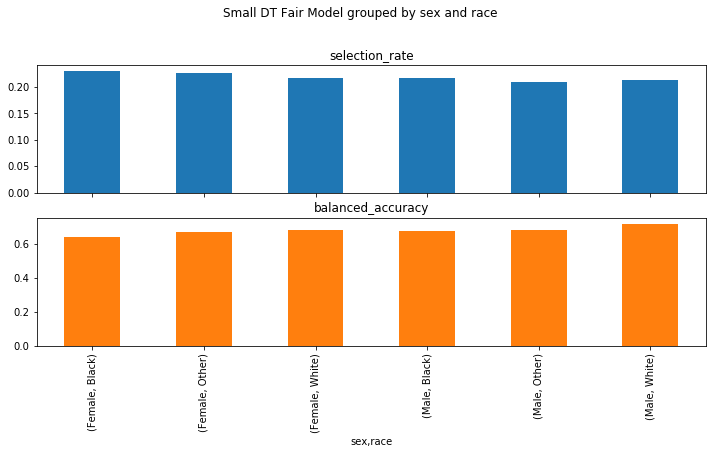

In [ ]:
plot_fairness_fair_model(model=dt_small_fair,
              model_name="Small DT Fair Model",
              sensitive_features_test=intersection_test,
              sensitive_features_names="sex and race",
              print_report=False,
              no_count=True
              )

### 5.2.6 Ethical Considerations



1.   **Does the model use any sensitive data?**
  - Yes the data uses features like `sex`, `race`, `native-country`, `occupation`
2.   **Is the model intended to inform decisions about matters central to human life?**
  - The model is trained to predict income but eventually designed to make predictions on credit scores. Therefore fairness with respect to sensitive charateristics is essential
3. **What risk mitigation strategies were used during
model development?**
  - The decision tree was post processed using `ThresholdOptimizer` to constrain selection rate differences
4. **What risks may be present in model usage?**
  - The model might use spurious correlations for determining the predicitons, e.g. `maital-status` is feature that was important to all models while more intuitve features like `occupation` were less important. That indicates that the model relies on spurious correlations (e.g. `marital-status` was highly correlated with `relationship_husband` and `sex`)
  - These risks could be abused by adversarials to trick the model




### 5.2.7 Caveats and Recommendations

- I recommend that the fairness of the model should be reassessed when deploying it on more balanced data and less biased data. The unfairness of the unmitigated model was mostly due to sampling and historical biases. Therefore the postprocessing heavily adjusted theses biases. It is unclear how robust that mitigation is if less biased data is used.
- One caveat I encountered sometimes is that due to the proprocessing using the `fairlearn` library, the model is no longer "`sklearn`"-standardized. Some libraries in the fair and explainable AI domain require a model to be implemented in a standard library like `sklearn`. For example I was unable to use the `dice_ml` framework for counterfactual analysis on the postprocessed model.
- **Privacy vs Transparency:** TODO

<a id='6_References'></a>
# 6 References

[1] [Molnar, Christoph. Interpretable machine learning (2020)](https://christophm.github.io/interpretable-ml-book/)  

[2] [Mehrabi, Ninareh, et al. "A survey on bias and fairness in machine learning." ACM Computing Surveys (CSUR) 54.6 (2021): 1-35.](https://arxiv.org/pdf/1908.09635.pdf)

[3] [Grinsztajn, Léo, Edouard Oyallon, and Gaël Varoquaux. "Why do tree-based models still outperform deep learning on tabular data?](https://arxiv.org/pdf/2207.08815.pdf)

[4] US Census 2022, https://www.census.gov/quickfacts/fact/table/US

[5] Citizenship and Immigration Statuses of the U.S. Foreign-Born
Population (2022) https://sgp.fas.org/crs/homesec/IF11806.pdf
